In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam

# Import Data

In [2]:
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

In [3]:
data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Revisi%20Analisis/Data%20TMA%20(Jan%202022%20-%20Juni%202025).csv')
data = data.loc[:, ['Daily_Period','TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

print(data.head())
print(data.tail())
print(data.shape)

  Daily_Period  TMA_Daily
0   01/01/2022       10.0
1   02/01/2022       10.0
2   03/01/2022       10.0
3   04/01/2022       10.0
4   05/01/2022       12.5
     Daily_Period  TMA_Daily
1210   25/04/2025  20.000000
1211   26/04/2025  20.000000
1212   27/04/2025  20.000000
1213   28/04/2025  21.666667
1214   29/04/2025  20.000000
(1215, 2)


# Eksplorasi Data

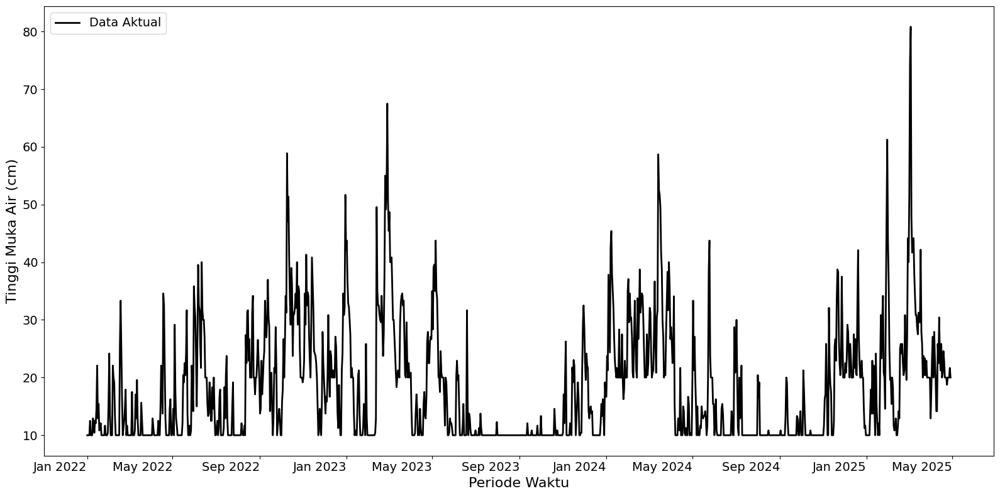

Dimension of full data: (1215, 2)


In [4]:
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, DateFormatter
import pandas as pd

# Pastikan kolom waktu dalam format datetime
data['Daily_Period'] = pd.to_datetime(data['Daily_Period'], format='%d/%m/%Y')

# Membuat plot seluruh data tanpa split
plt.figure(figsize=(16, 8))
plt.plot(data['Daily_Period'], data['TMA_Daily'], lw=2, color='black', label='Data Aktual')

# Label dan format
plt.xlabel('Periode Waktu', fontsize=16)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=16)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set axis locator dan format tanggal
plt.gca().xaxis.set_major_locator(MonthLocator(bymonth=[1, 5, 9]))
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))

# Format rotasi tanggal
plt.gcf().autofmt_xdate(rotation=0)

# Tambahkan legend
plt.legend(fontsize=14)
# plt.title('Plot Seluruh Data Time Series TMA', fontsize=18)

plt.tight_layout()
plt.show()

# Print dimensi total
print('Dimension of full data:', data.shape)

# Normalisasi Data

Proses normalisasi data dilakukan menggunakan metode min-max normalization hingga menghasilkan data yang berskala [0,1].

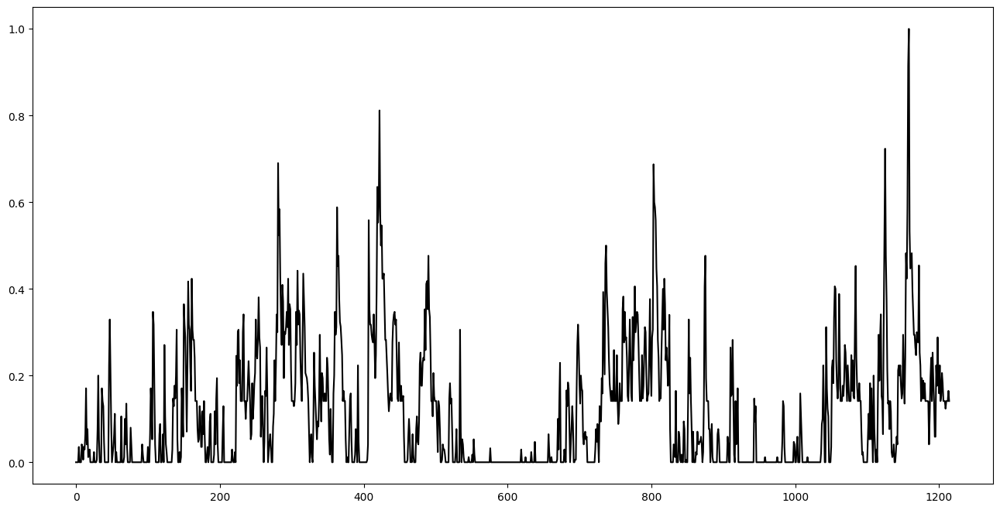

In [5]:
# Step 1: Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
data['TMA_normalized'] = scaler.fit_transform(data['TMA_Daily'].values.reshape(-1, 1))
plt.figure(figsize=(16, 8))
plt.plot(data['TMA_normalized'], color='black')

In [6]:
print(data['TMA_normalized'].head())
print(data['TMA_normalized'].tail())

0    0.000000
1    0.000000
2    0.000000
3    0.000000
4    0.035294
Name: TMA_normalized, dtype: float64
1210    0.141176
1211    0.141176
1212    0.141176
1213    0.164706
1214    0.141176
Name: TMA_normalized, dtype: float64


# Hyperparameter Tuning & Cross Validation

Hyperparameter tuning dilakukan untuk menentukan hyperparameter terbaik melalui langkah validasi berupa *time series k-fold cross validation*. Banyaknya fold yang digunakan dalam langkah validasi adalah sebanyak k = 5 fold.

In [7]:
data_series = data['TMA_normalized'].values
data_series = data_series.reshape((len(data_series), 1))
data_series

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.14117647],
       [0.16470588],
       [0.14117647]])

In [8]:
from tensorflow.keras.initializers import HeUniform, GlorotUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Pilih initializer berdasarkan parameter
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    elif init_scheme == 'glorot_uniform':
        initializer = GlorotUniform()
    else:
        raise ValueError("init_scheme harus 'he_uniform' atau 'glorot_uniform'")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(30, 1),
        return_sequences=True,
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(LSTM(
        16,
        activation='tanh',
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1, kernel_initializer=initializer, bias_initializer='zeros'))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [9]:
import keras

class EarlyStoppingAtMinLoss(keras.callbacks.Callback):
    """Stop training when the loss is at its min, i.e. the loss stops decreasing.

    Arguments:
        patience: Number of epochs to wait after min has been hit. After this
        number of no improvement, training stops.
    """

    def __init__(self, patience=0):
        super().__init__()
        self.patience = patience
        # best_weights to store the weights at which the minimum loss occurs.
        self.best_weights = None

    def on_train_begin(self, logs=None):
        # The number of epoch it has waited when loss is no longer minimum.
        self.wait = 0
        # The epoch the training stops at.
        self.stopped_epoch = 0
        # Initialize the best as infinity.
        self.best = np.inf

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get("val_loss")
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            # print('abcd')
            # Record the best weights if current results is better (less).
            self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                print("Restoring model weights from the end of the best epoch.")
                self.model.set_weights(self.best_weights)

    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print("Epoch %05d: early stopping" % (self.stopped_epoch + 1))

## Sliding Window Cross Validation

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1171 - val_loss: 0.1565
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0237 - val_loss: 0.0713
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0161 - val_loss: 0.0207
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0099 - val_loss: 0.0222
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0090 - val_loss: 0.0184
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0072 - val_loss: 0.0190
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0068 - val_loss: 0.0210
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0064 - val_loss: 0.0221
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0038 - val_loss: 0.0225
Epoch 10/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0032Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0051 - val_loss: 0.0231
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/

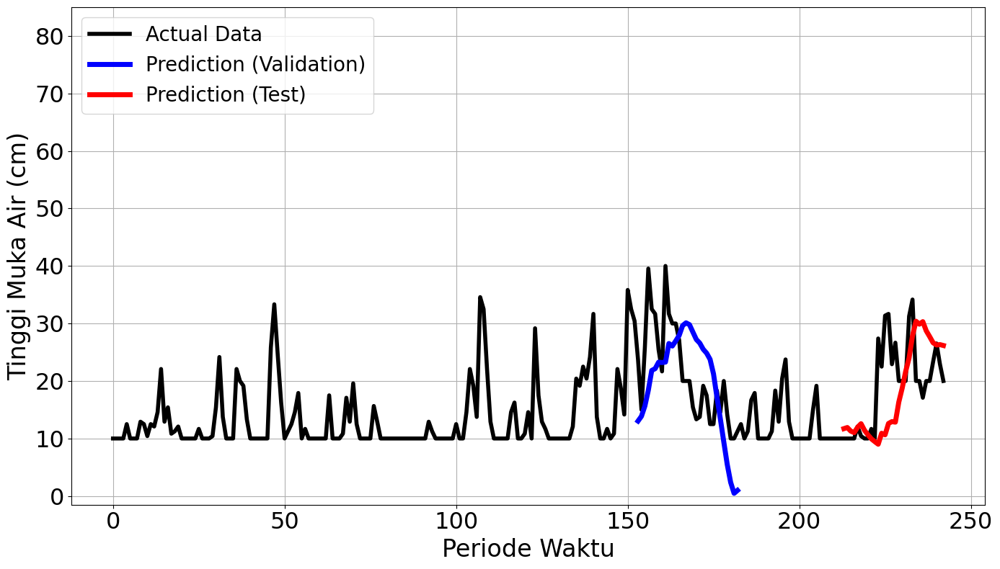

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.0470 - val_loss: 0.1344
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0540 - val_loss: 0.1463
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0463 - val_loss: 0.1400
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0182 - val_loss: 0.1153
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0154 - val_loss: 0.1014
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0190 - val_loss: 0.1022
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0179 - val_loss: 0.1111
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0146 - val_loss: 0.1116
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0160 - val_loss: 0.1141
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0158 Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0157 - val_loss: 0.1139
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms

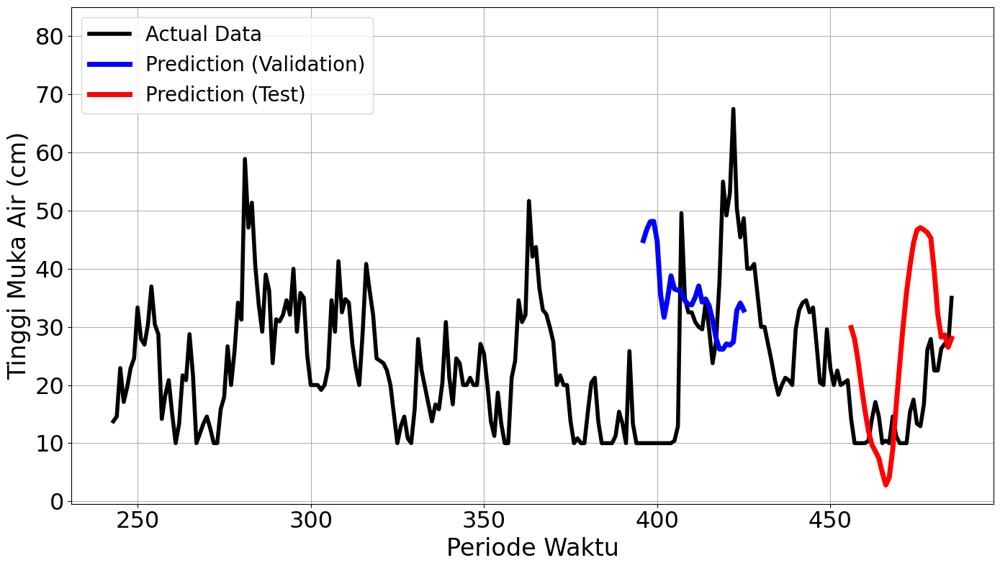

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.0564 - val_loss: 0.0042
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0321 - val_loss: 0.0024
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0220 - val_loss: 6.9867e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0052 - val_loss: 2.0546e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0082 - val_loss: 2.4192e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0039 - val_loss: 2.7947e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0029 - val_loss: 2.4708e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0022 - val_loss: 3.4183e-04
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0033 - val_loss: 1.9921e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0024 - val_loss: 4.2992e-04
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0024 - val_loss: 5.1013e-04
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
mape validation = 5.8206237422655915 %
mape test = 43.92127669287511 %


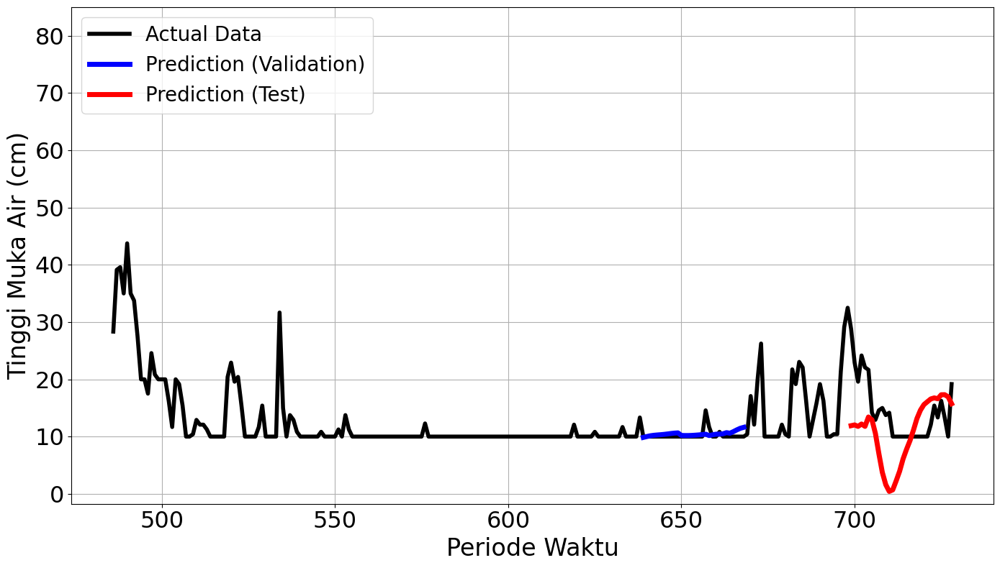

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1255 - val_loss: 0.0633
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0245 - val_loss: 0.0115
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0215 - val_loss: 0.0071
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0147 - val_loss: 0.0089
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0201 - val_loss: 0.0115
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0105 - val_loss: 0.0061
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0144 - val_loss: 0.0053
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0203 - val_loss: 0.0064
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0112 - val_loss: 0.0072
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0190 - val_loss: 0.0072
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0108 - val_loss: 0.0074
Epoch 12/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0066Restoring model weigh

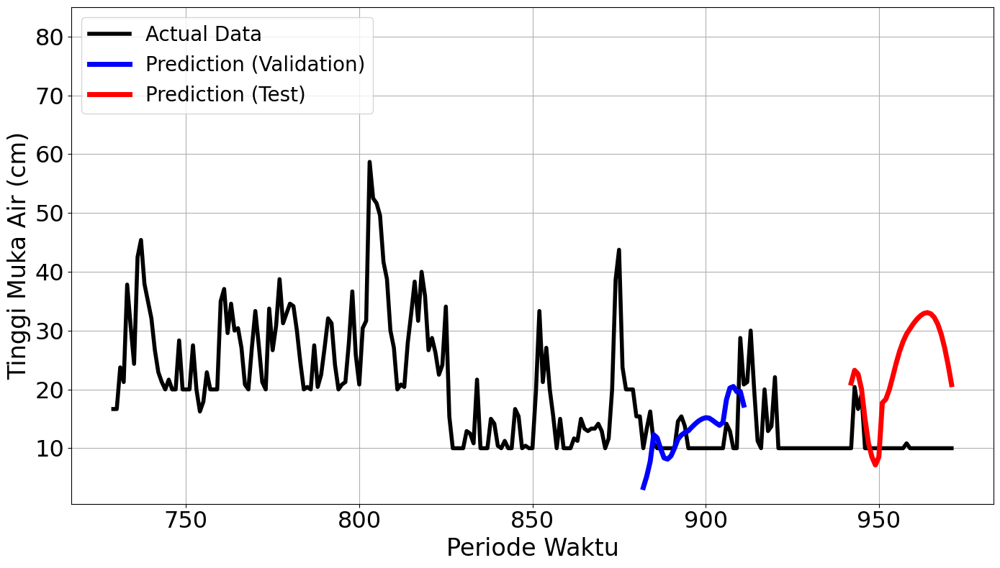

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.0704 - val_loss: 0.0977
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0413 - val_loss: 0.0629
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0133 - val_loss: 0.0476
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0152 - val_loss: 0.0364
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0088 - val_loss: 0.0376
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0127 - val_loss: 0.0322
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0110 - val_loss: 0.0301
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0089 - val_loss: 0.0296
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0130 - val_loss: 0.0320
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0105 - val_loss: 0.0352
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - val_loss: 0.0376
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0047 - val_loss: 0.0374
E

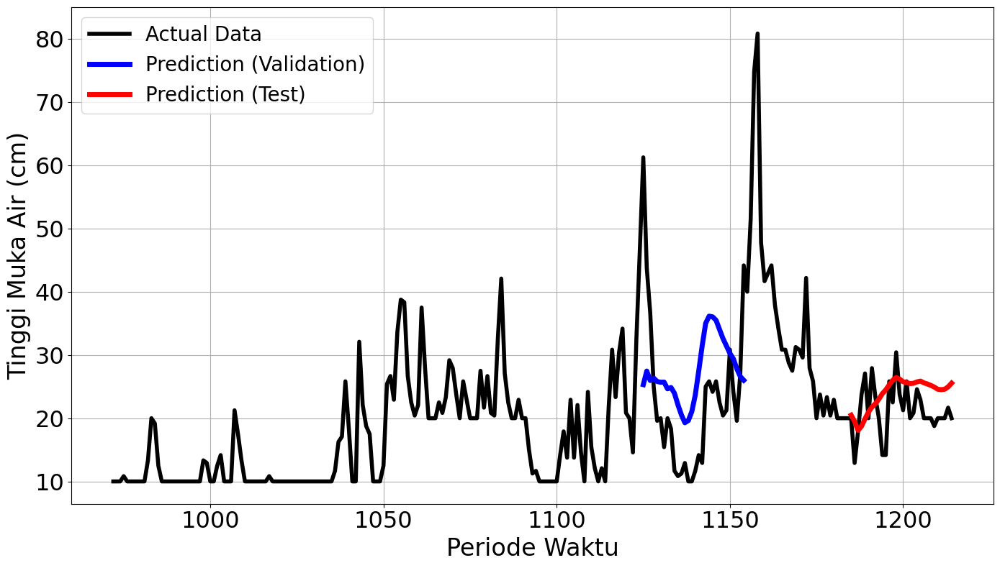

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5357
Final Average MAPE Test: 0.6426
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1171 - val_loss: 0.1565
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0237 - val_loss: 0.0713
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0161 - val_loss: 0.0207
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0099 - val_loss: 0.0222
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0090 - val_loss: 0.0184
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0072 - val_loss: 0.0190
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0068 - val_loss: 0.0210
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0064 - val_loss: 0.0221
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0038 - val_loss: 0.0225
Epoch 10/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0032Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0051 - val_loss: 0.0231
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/s

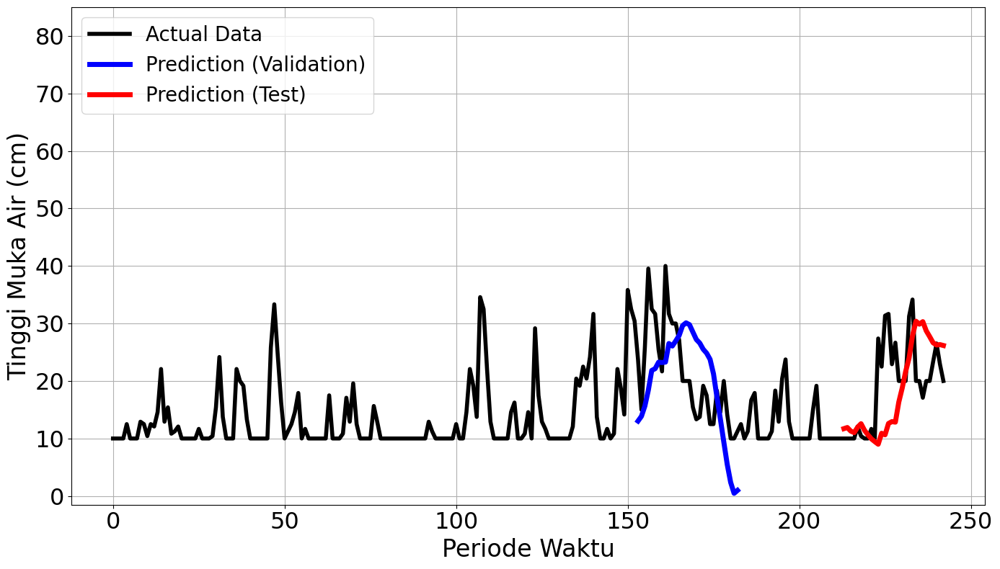

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0470 - val_loss: 0.1344
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0540 - val_loss: 0.1463
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0463 - val_loss: 0.1400
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0182 - val_loss: 0.1153
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0154 - val_loss: 0.1014
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0190 - val_loss: 0.1022
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0179 - val_loss: 0.1111
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0146 - val_loss: 0.1116
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0160 - val_loss: 0.1141
Epoch 10/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0160 Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0157 - val_loss: 0.1139
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/

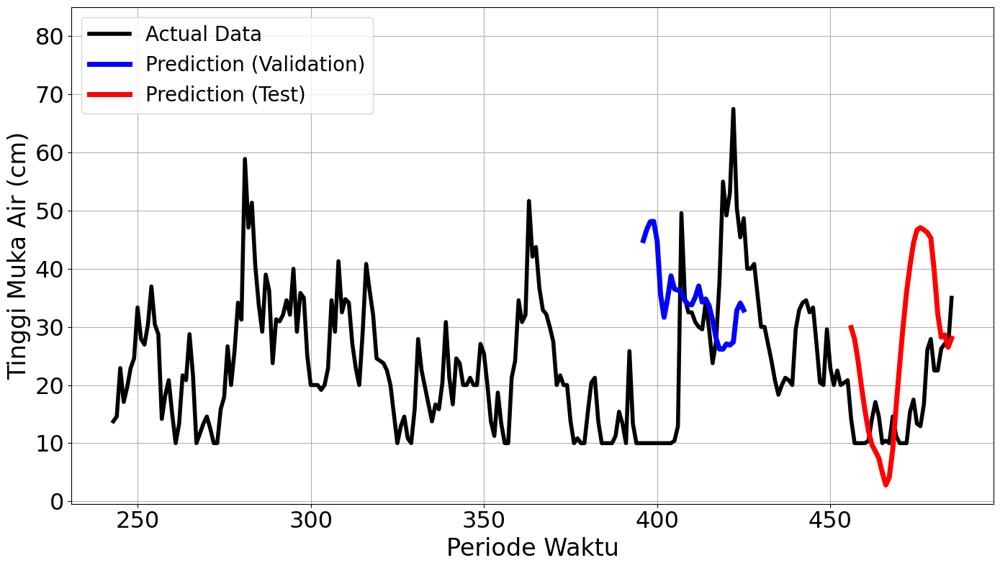

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.0564 - val_loss: 0.0042
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0321 - val_loss: 0.0024
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0220 - val_loss: 6.9867e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0052 - val_loss: 2.0546e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0082 - val_loss: 2.4192e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0039 - val_loss: 2.7947e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0029 - val_loss: 2.4708e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0022 - val_loss: 3.4183e-04
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0033 - val_loss: 1.9921e-04
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0024 - val_loss: 4.2992e-04
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0024 - val_loss: 5.1013e-04
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

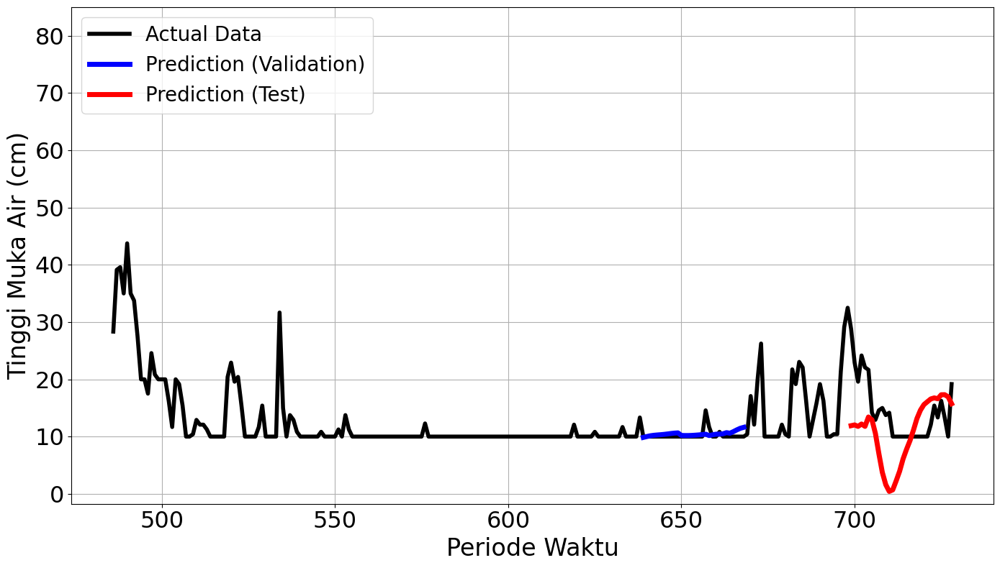

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1255 - val_loss: 0.0633
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0245 - val_loss: 0.0115
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0215 - val_loss: 0.0071
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0147 - val_loss: 0.0089
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0201 - val_loss: 0.0115
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0105 - val_loss: 0.0061
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0144 - val_loss: 0.0053
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0203 - val_loss: 0.0064
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0112 - val_loss: 0.0072
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0190 - val_loss: 0.0072
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0108 - val_loss: 0.0074
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0122Restoring model weigh

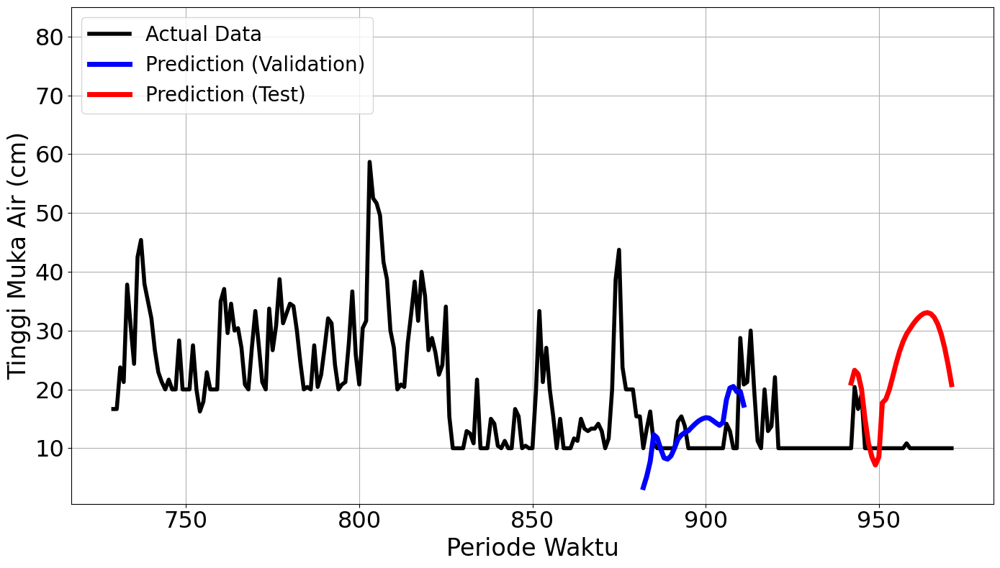

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - loss: 0.0704 - val_loss: 0.0977
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0413 - val_loss: 0.0629
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0133 - val_loss: 0.0476
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0152 - val_loss: 0.0364
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0088 - val_loss: 0.0376
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0127 - val_loss: 0.0322
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0110 - val_loss: 0.0301
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0089 - val_loss: 0.0296
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0130 - val_loss: 0.0320
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - val_loss: 0.0352
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0051 - val_loss: 0.0376
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0047 - val_loss: 0.0374


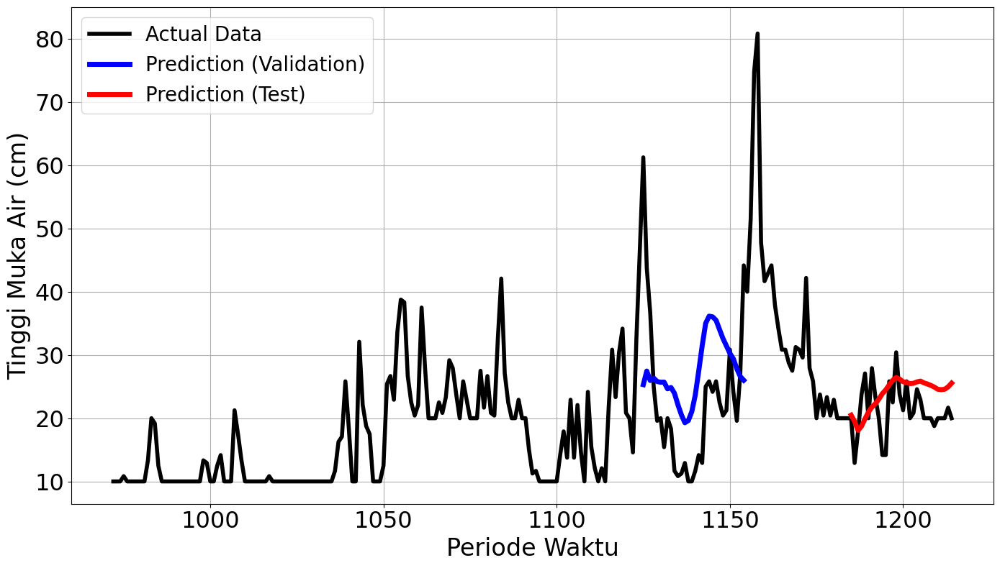

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5357
Final Average MAPE Test: 0.6426
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 178ms/step - loss: 0.0942 - val_loss: 0.1432
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0424 - val_loss: 0.2142
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0319 - val_loss: 0.1217
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0171 - val_loss: 0.0560
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0141 - val_loss: 0.0305
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0121 - val_loss: 0.0249
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0144 - val_loss: 0.0232
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0140 - val_loss: 0.0221
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0084 - val_loss: 0.0206
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0087 - val_loss: 0.0184
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0096 - val_loss: 0.0173
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0085 - val_loss: 0.0158


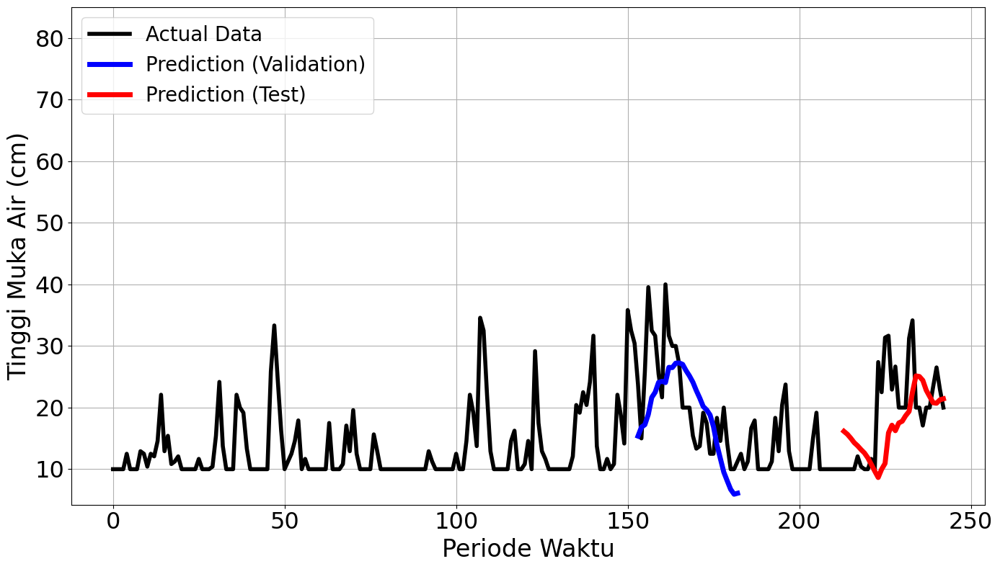

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 167ms/step - loss: 0.0339 - val_loss: 0.2154
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0227 - val_loss: 0.1985
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0180 - val_loss: 0.1975
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0154 - val_loss: 0.1922
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0155 - val_loss: 0.1879
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0151 - val_loss: 0.1712
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0143 - val_loss: 0.1585
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0183 - val_loss: 0.1623
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0142 - val_loss: 0.1669
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0139 - val_loss: 0.1620
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0112 - val_loss: 0.1593
Epoch 12/150
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0162Restoring model weig

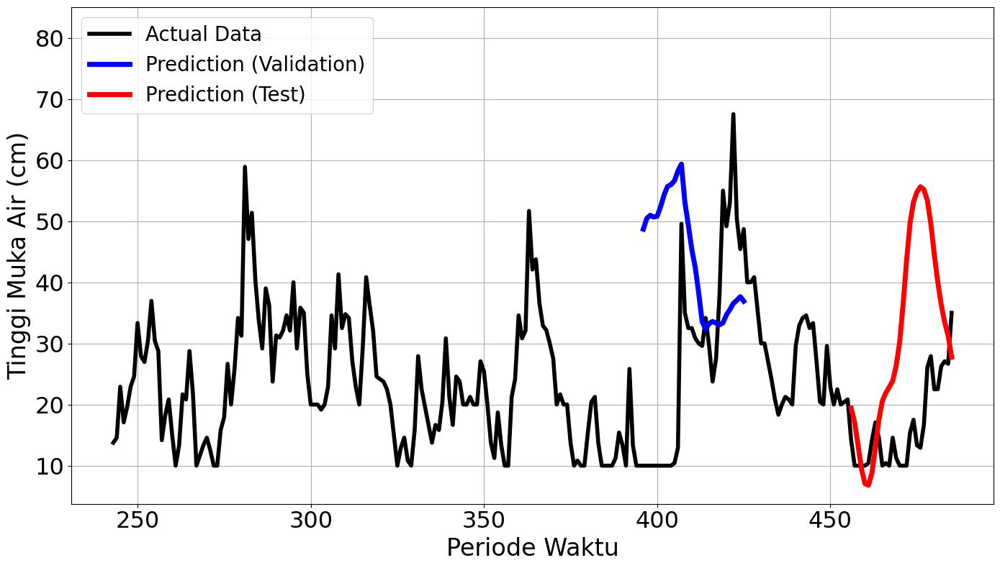

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.0926 - val_loss: 0.0389
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0473 - val_loss: 0.0140
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0232 - val_loss: 9.7143e-04
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0128 - val_loss: 8.6611e-04
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - val_loss: 8.7272e-04
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0032 - val_loss: 0.0014
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0033 - val_loss: 4.4025e-04
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0022 - val_loss: 4.6208e-04
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0030 - val_loss: 6.8356e-04
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0034 - val_loss: 6.4809e-04
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0025 - val_loss: 4.1444e-04
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - 

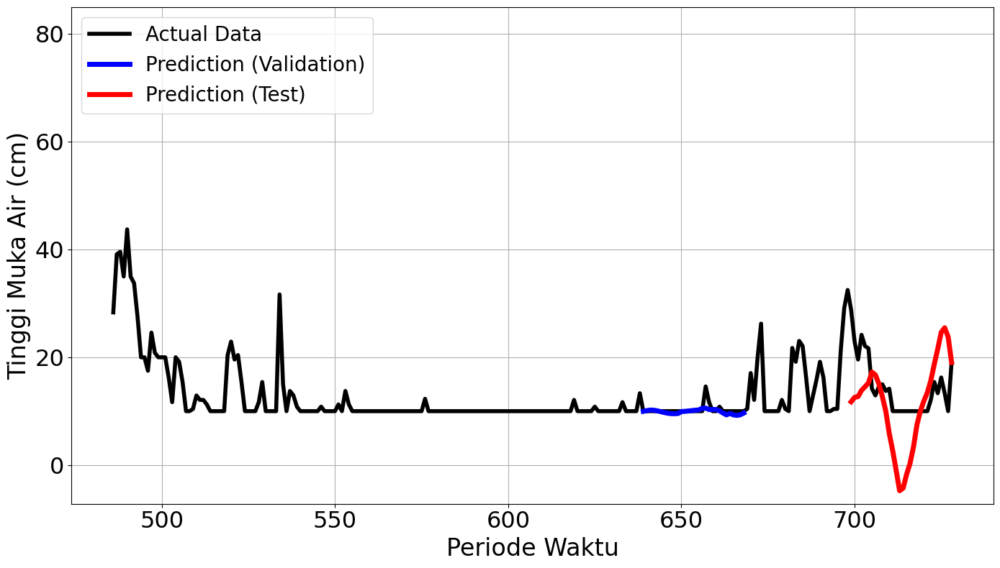

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 171ms/step - loss: 0.1131 - val_loss: 0.0910
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0353 - val_loss: 0.0180
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0181 - val_loss: 0.0069
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0259 - val_loss: 0.0105
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0259 - val_loss: 0.0067
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0233 - val_loss: 0.0041
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0238 - val_loss: 0.0045
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0214 - val_loss: 0.0047
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0197 - val_loss: 0.0048
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0142 - val_loss: 0.0050
Epoch 11/150
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0107Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0

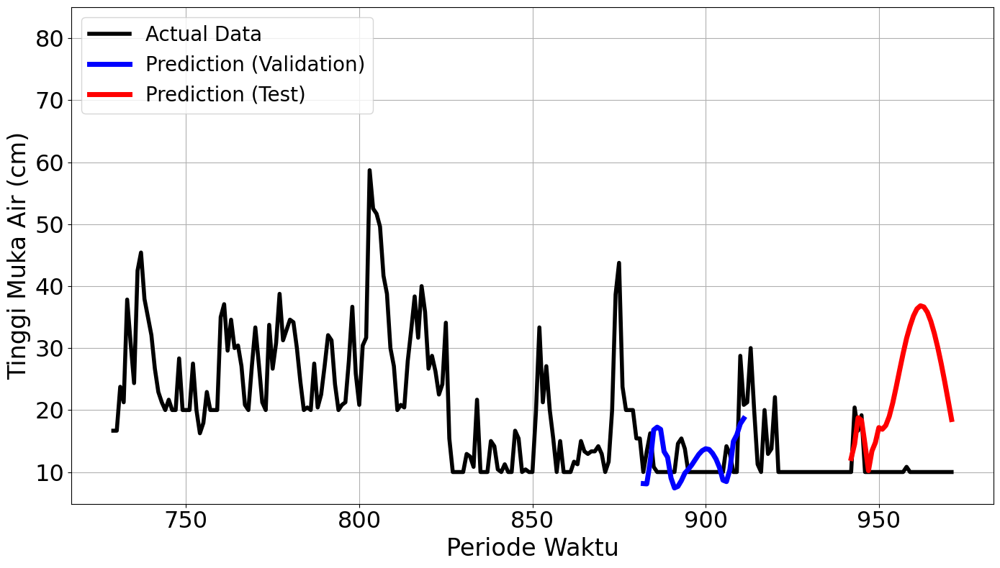

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - loss: 0.1330 - val_loss: 0.0435
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0439 - val_loss: 0.0417
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0320 - val_loss: 0.0378
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0179 - val_loss: 0.0345
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0186 - val_loss: 0.0329
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0111 - val_loss: 0.0327
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0149 - val_loss: 0.0331
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0143 - val_loss: 0.0344
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0099 - val_loss: 0.0361
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0068 - val_loss: 0.0371
Epoch 11/150
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0102Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0

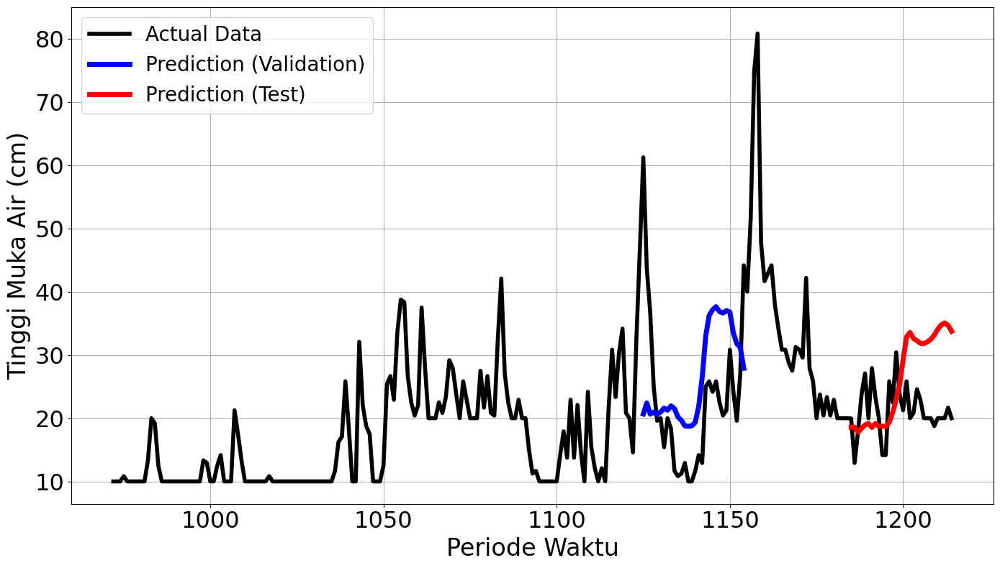

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5772
Final Average MAPE Test: 0.7393
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 276ms/step - loss: 0.0942 - val_loss: 0.1432
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0424 - val_loss: 0.2142
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0319 - val_loss: 0.1217
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0171 - val_loss: 0.0560
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0141 - val_loss: 0.0305
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0121 - val_loss: 0.0249
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0144 - val_loss: 0.0232
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0140 - val_loss: 0.0221
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0084 - val_loss: 0.0206
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0087 - val_loss: 0.0184
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0096 - val_loss: 0.0173
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0085 - val_loss: 0.0158


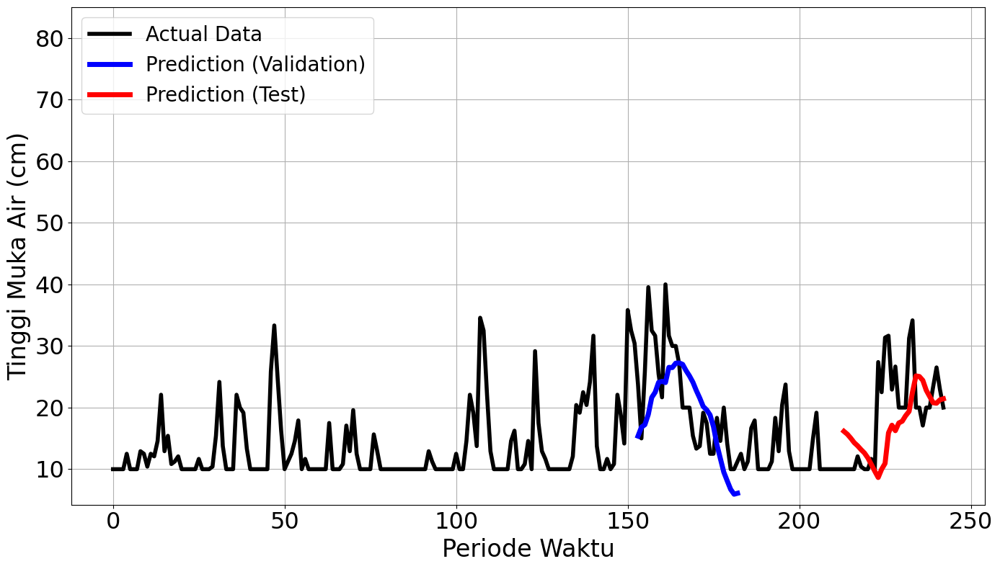

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.0339 - val_loss: 0.2154
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0227 - val_loss: 0.1985
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0180 - val_loss: 0.1975
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0154 - val_loss: 0.1922
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0155 - val_loss: 0.1879
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0151 - val_loss: 0.1712
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0143 - val_loss: 0.1585
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0183 - val_loss: 0.1623
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0142 - val_loss: 0.1669
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0139 - val_loss: 0.1620
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0112 - val_loss: 0.1593
Epoch 12/150
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0162Restoring model weig

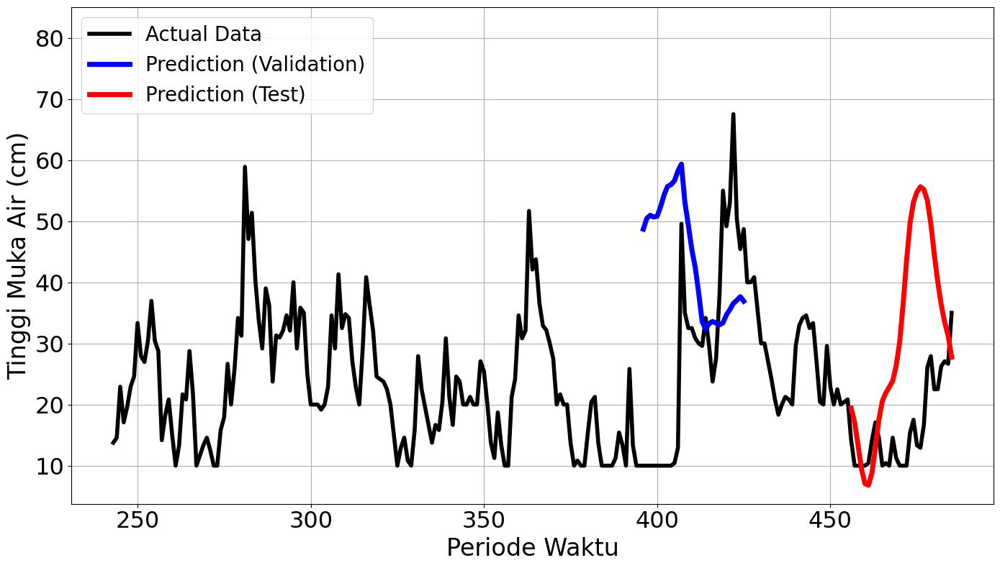

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0926 - val_loss: 0.0389
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0473 - val_loss: 0.0140
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0232 - val_loss: 9.7143e-04
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0128 - val_loss: 8.6611e-04
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0079 - val_loss: 8.7272e-04
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0032 - val_loss: 0.0014
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0033 - val_loss: 4.4025e-04
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0022 - val_loss: 4.6208e-04
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0030 - val_loss: 6.8356e-04
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0034 - val_loss: 6.4809e-04
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0025 - val_loss: 4.1444e-04
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - 

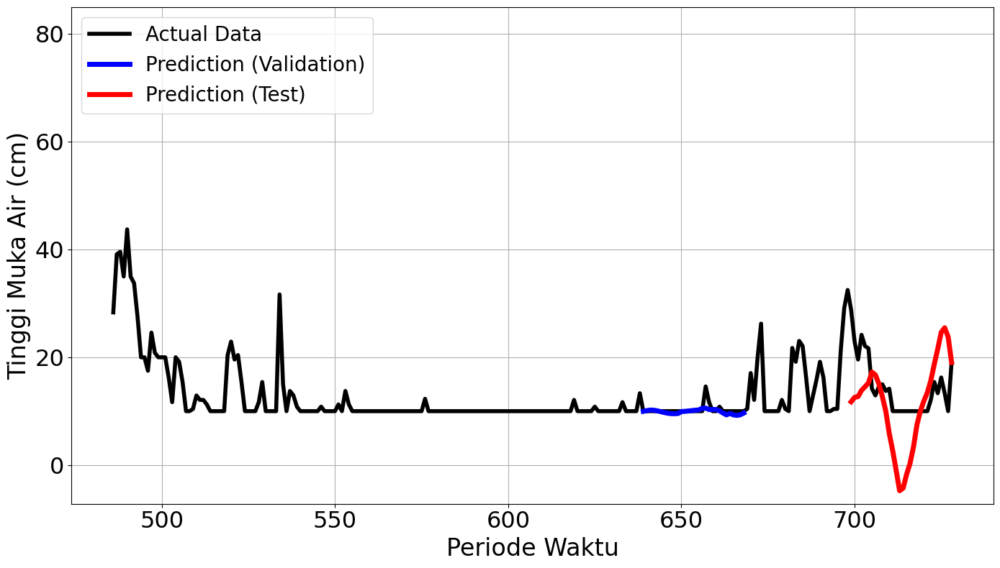

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.1131 - val_loss: 0.0910
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0353 - val_loss: 0.0180
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0181 - val_loss: 0.0069
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0259 - val_loss: 0.0105
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0259 - val_loss: 0.0067
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0233 - val_loss: 0.0041
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0238 - val_loss: 0.0045
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0214 - val_loss: 0.0047
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0197 - val_loss: 0.0048
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0142 - val_loss: 0.0050
Epoch 11/150
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0107Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0

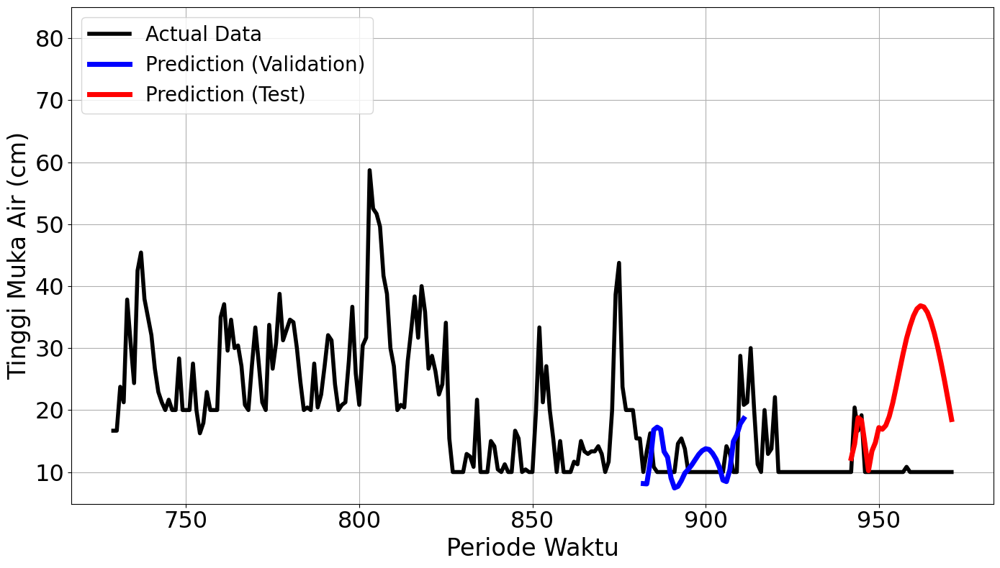

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.1330 - val_loss: 0.0435
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0439 - val_loss: 0.0417
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0320 - val_loss: 0.0378
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0179 - val_loss: 0.0345
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0186 - val_loss: 0.0329
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0111 - val_loss: 0.0327
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0149 - val_loss: 0.0331
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0143 - val_loss: 0.0344
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - val_loss: 0.0361
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0068 - val_loss: 0.0371
Epoch 11/150
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0102Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0

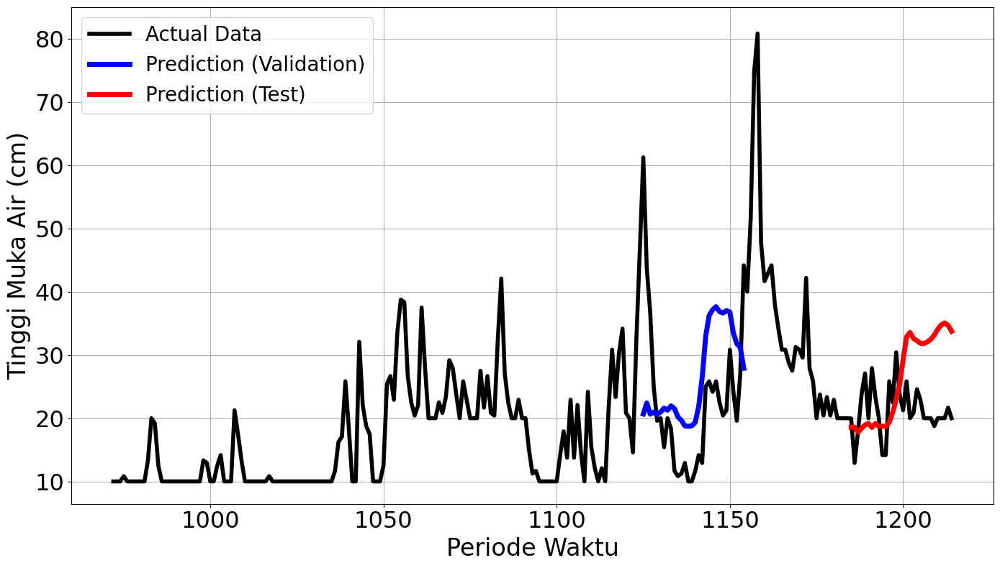

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5772
Final Average MAPE Test: 0.7393
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 355ms/step - loss: 0.2067 - val_loss: 0.0725
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0376 - val_loss: 0.1156
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0202 - val_loss: 0.1181
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0187 - val_loss: 0.0834
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0162 - val_loss: 0.0443
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0131 - val_loss: 0.0267
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0128 - val_loss: 0.0201
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0129 - val_loss: 0.0186
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0113 - val_loss: 0.0182
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0104 - val_loss: 0.0184
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0081 - val_loss: 0.0184
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0077 - val_loss: 0.0178

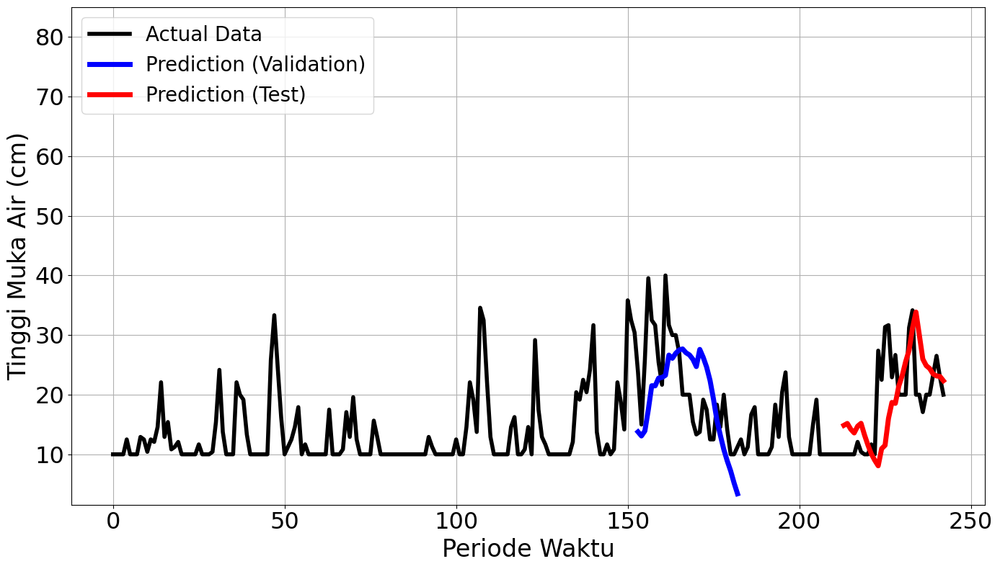

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 338ms/step - loss: 0.0451 - val_loss: 0.1742
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0462 - val_loss: 0.1349
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0415 - val_loss: 0.1240
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0260 - val_loss: 0.1231
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0323 - val_loss: 0.1263
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0282 - val_loss: 0.1204
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0196 - val_loss: 0.1162
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0182 - val_loss: 0.1071
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0169 - val_loss: 0.0977
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0214 - val_loss: 0.0896
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0180 - val_loss: 0.0863
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0264 - val_loss: 0.0896


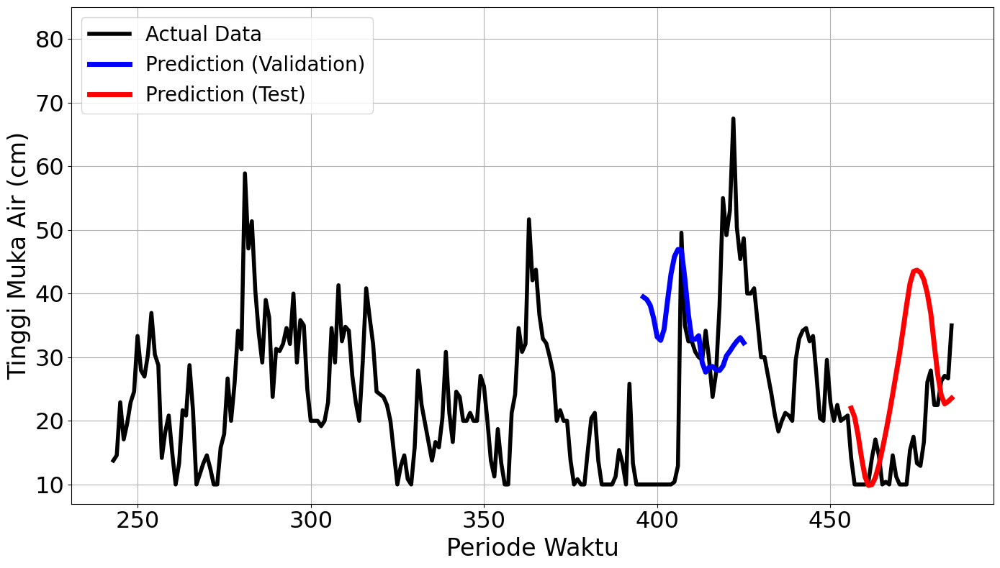

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 568ms/step - loss: 0.1880 - val_loss: 5.3789e-04
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0179 - val_loss: 0.0061
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0132 - val_loss: 0.0036
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0118 - val_loss: 6.7575e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0122 - val_loss: 6.9568e-04
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0018Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0087 - val_loss: 0.0016
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
mape validation = 13.994408912130895 %
mape test = 134.18608705955756 %


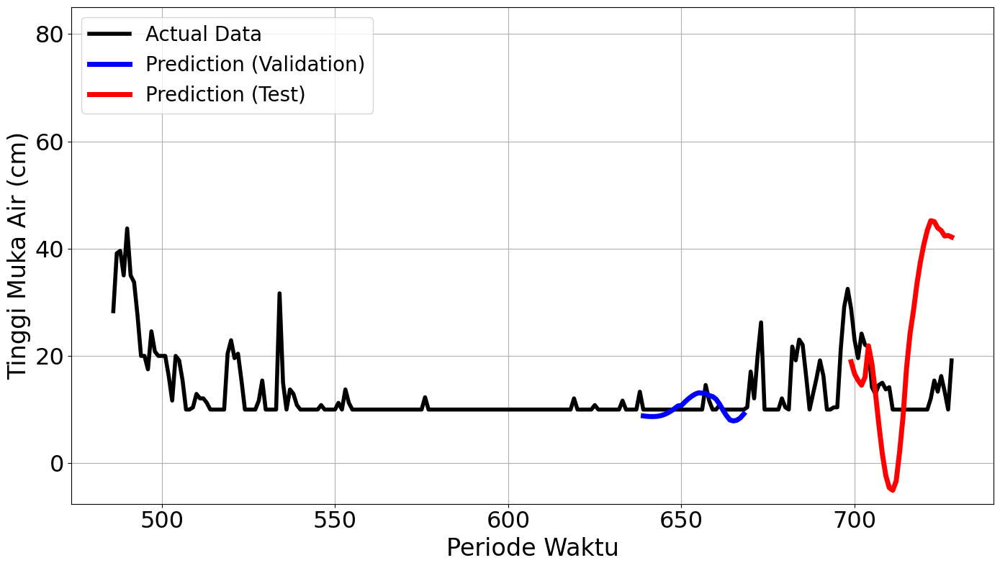

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 332ms/step - loss: 0.1055 - val_loss: 0.2476
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1038 - val_loss: 0.0965
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0430 - val_loss: 0.0179
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0204 - val_loss: 0.0238
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0301 - val_loss: 0.0363
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0293 - val_loss: 0.0306
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0227 - val_loss: 0.0217
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0211 - val_loss: 0.0123
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0154 - val_loss: 0.0096
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0198 - val_loss: 0.0103
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0139 - val_loss: 0.0117
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0169 - val_loss: 0.0125


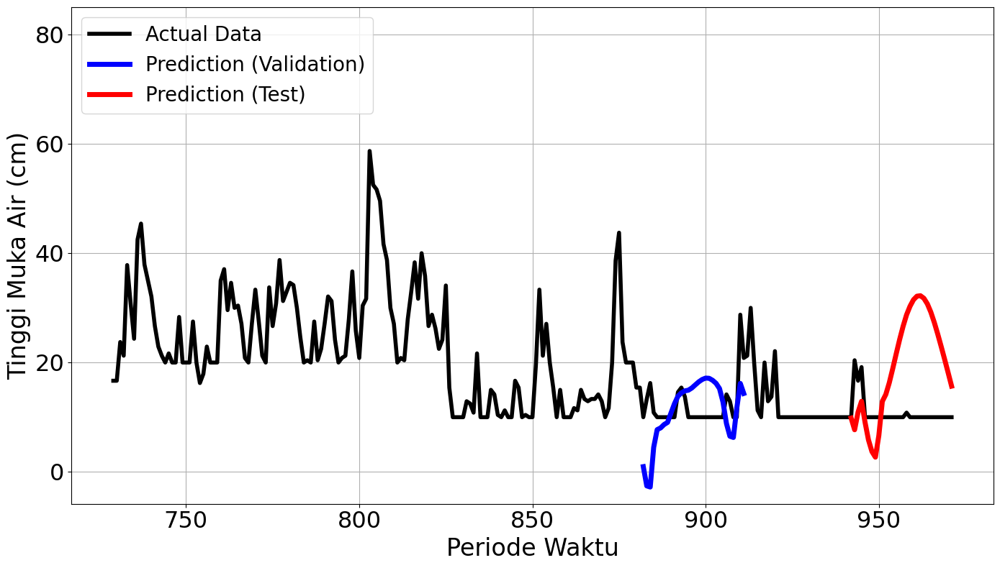

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 355ms/step - loss: 0.1288 - val_loss: 0.0206
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0330 - val_loss: 0.0391
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0302 - val_loss: 0.0452
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0208 - val_loss: 0.0481
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0214 - val_loss: 0.0449
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0073Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0105 - val_loss: 0.0407
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
mape validation = 35.997779404397136 %
mape test = 18.66517683151615 %


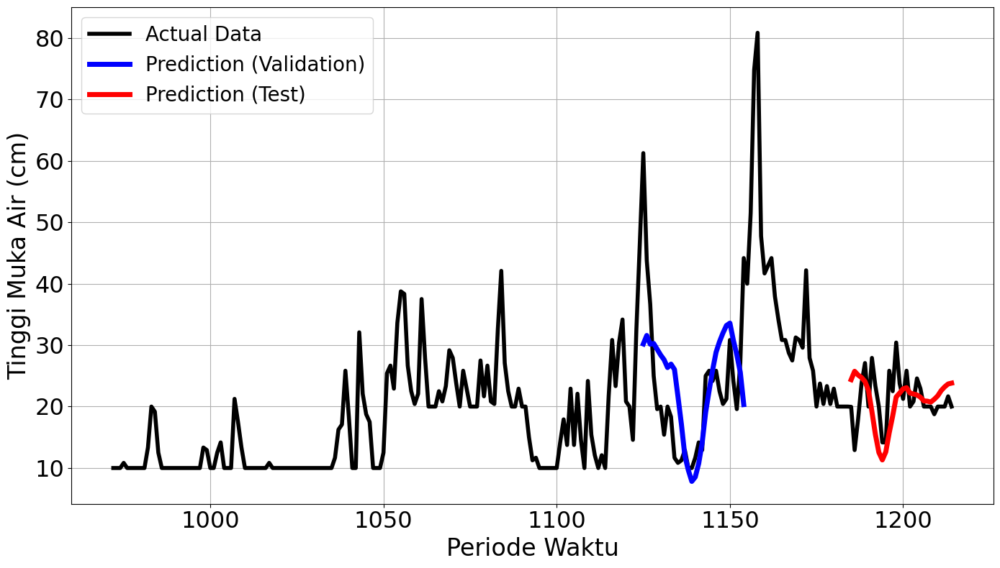

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4982
Final Average MAPE Test: 0.7701
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 384ms/step - loss: 0.2067 - val_loss: 0.0725
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0376 - val_loss: 0.1156
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0202 - val_loss: 0.1181
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0187 - val_loss: 0.0834
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0162 - val_loss: 0.0443
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0131 - val_loss: 0.0267
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0128 - val_loss: 0.0201
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0129 - val_loss: 0.0186
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0113 - val_loss: 0.0182
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0104 - val_loss: 0.0184
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0081 - val_loss: 0.0184
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0077 - val_loss: 0.0178

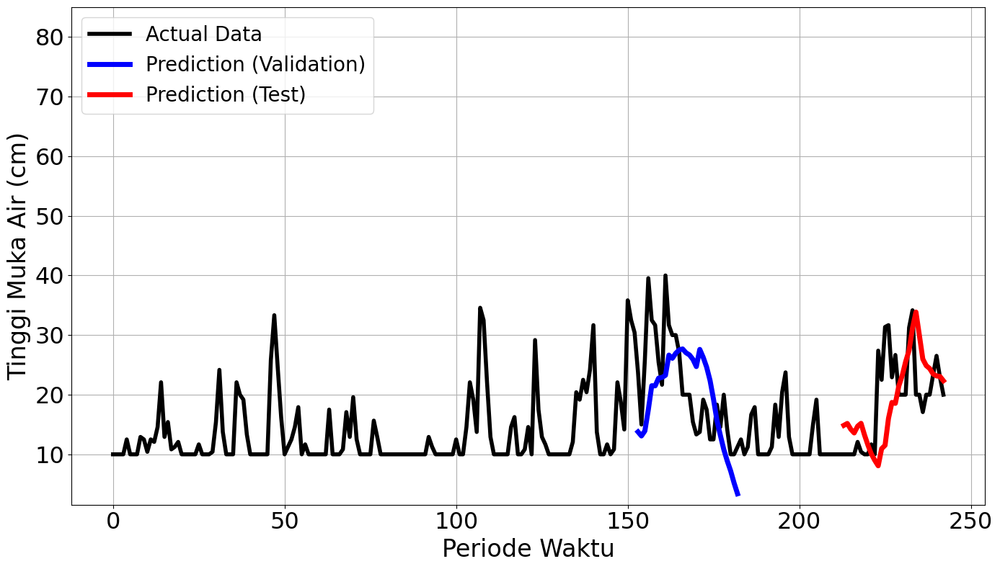

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 337ms/step - loss: 0.0451 - val_loss: 0.1742
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0462 - val_loss: 0.1349
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0415 - val_loss: 0.1240
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0260 - val_loss: 0.1231
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0323 - val_loss: 0.1263
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0282 - val_loss: 0.1204
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0196 - val_loss: 0.1162
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0182 - val_loss: 0.1071
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0169 - val_loss: 0.0977
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0214 - val_loss: 0.0896
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0180 - val_loss: 0.0863
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0264 - val_loss: 0.0896


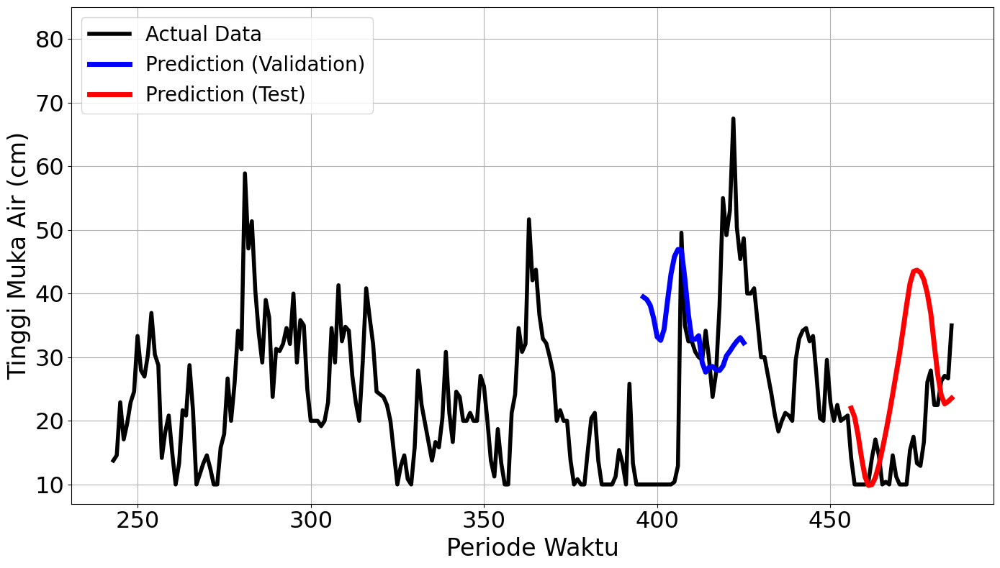

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 463ms/step - loss: 0.1880 - val_loss: 5.3789e-04
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0179 - val_loss: 0.0061
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0132 - val_loss: 0.0036
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0118 - val_loss: 6.7575e-04
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0122 - val_loss: 6.9568e-04
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0018Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0087 - val_loss: 0.0016
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
mape validation = 13.994408912130895 %
mape test = 134.18608705955756 %


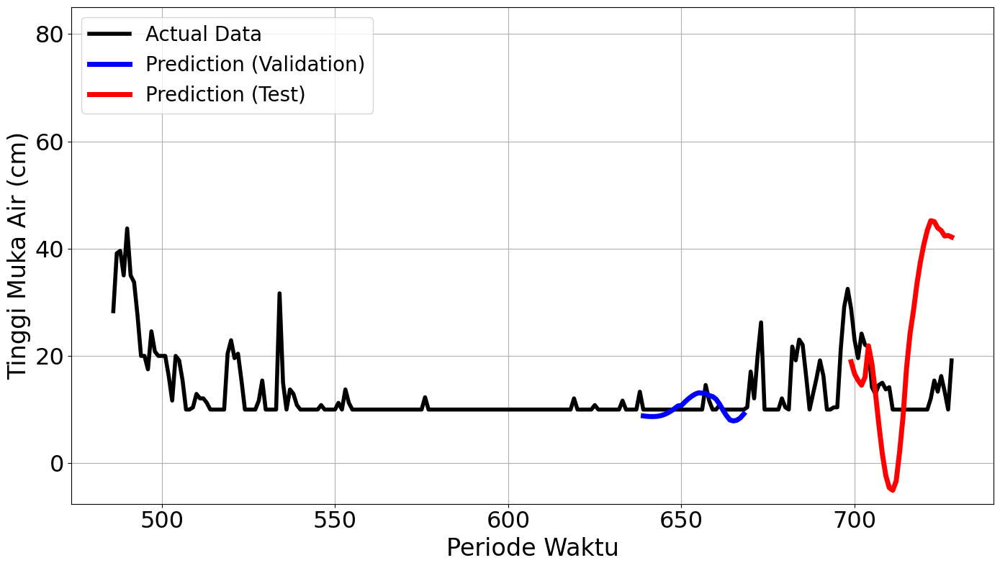

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 339ms/step - loss: 0.1055 - val_loss: 0.2476
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.1038 - val_loss: 0.0965
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0430 - val_loss: 0.0179
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0204 - val_loss: 0.0238
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0301 - val_loss: 0.0363
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0293 - val_loss: 0.0306
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0227 - val_loss: 0.0217
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0211 - val_loss: 0.0123
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0154 - val_loss: 0.0096
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0198 - val_loss: 0.0103
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0139 - val_loss: 0.0117
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0169 - val_loss: 0.0125


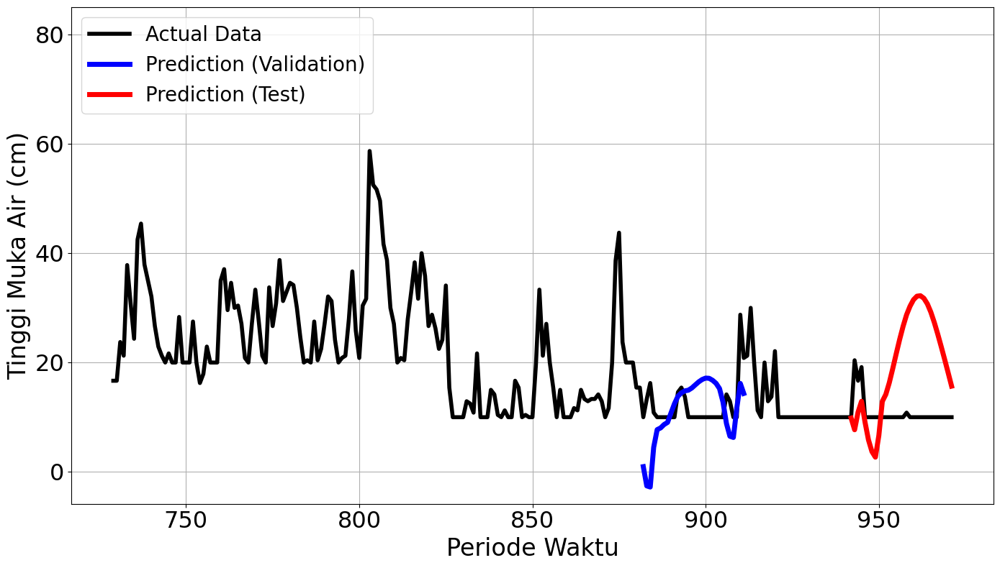

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - loss: 0.1288 - val_loss: 0.0206
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0330 - val_loss: 0.0391
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0302 - val_loss: 0.0452
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0208 - val_loss: 0.0481
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0214 - val_loss: 0.0449
Epoch 6/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0073Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0105 - val_loss: 0.0407
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
mape validation = 35.997779404397136 %
mape test = 18.66517683151615 %


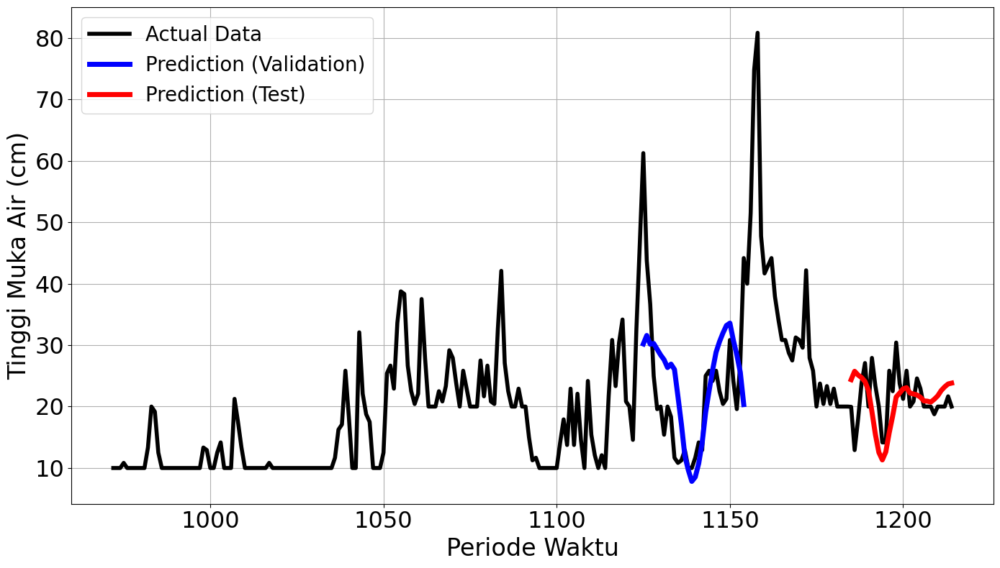

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.4982
Final Average MAPE Test: 0.7701
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1945 - val_loss: 0.0535
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1077 - val_loss: 0.0789
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0564 - val_loss: 0.1024
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0278 - val_loss: 0.1152
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0221 - val_loss: 0.1129
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0216Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0216 - val_loss: 0.0980
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
mape validation = 70.2253616568346 %
mape test = 138.02696936081495 %


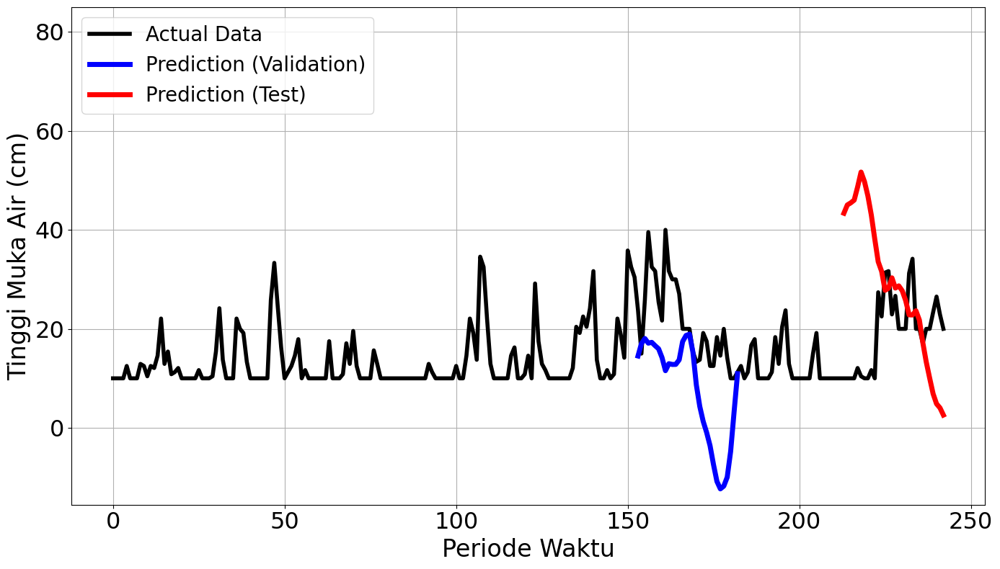

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0421 - val_loss: 0.1900
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0295 - val_loss: 0.1913
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0343 - val_loss: 0.1829
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0302 - val_loss: 0.1708
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0213 - val_loss: 0.1635
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0205 - val_loss: 0.1611
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0148 - val_loss: 0.1601
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0178 - val_loss: 0.1581
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0196 - val_loss: 0.1558
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0153 - val_loss: 0.1536
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0165 - val_loss: 0.1511
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0141 - val_loss: 0.

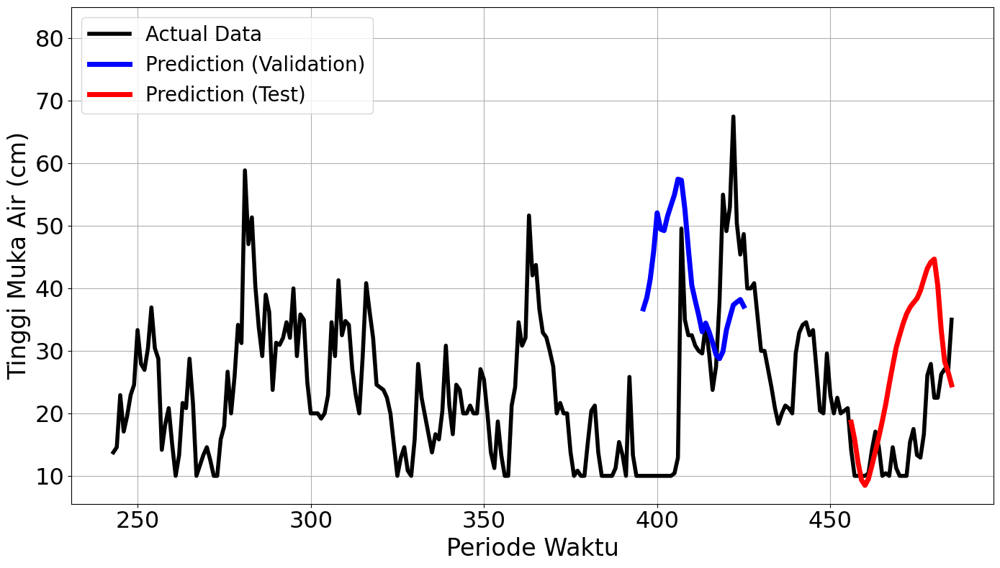

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1632 - val_loss: 0.0044
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step - loss: 0.0862 - val_loss: 0.0067
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0415 - val_loss: 0.0028
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0184 - val_loss: 5.1594e-04
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0203 - val_loss: 8.2984e-04
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - loss: 0.0249 - val_loss: 0.0021
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step - loss: 0.0265 - val_loss: 0.0027
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0220 - val_loss: 0.0022
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0210Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0210 - val_loss: 0.0012
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
mape validation = 13.94468239

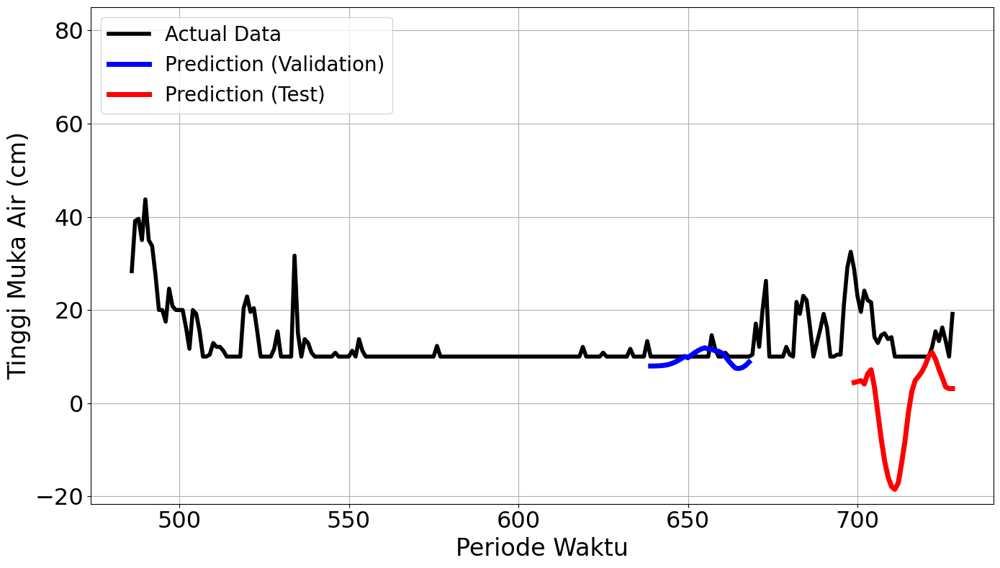

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1128 - val_loss: 0.2447
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - loss: 0.0578 - val_loss: 0.1851
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0600 - val_loss: 0.1141
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0475 - val_loss: 0.0522
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0327 - val_loss: 0.0165
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0246 - val_loss: 0.0084
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0194 - val_loss: 0.0153
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0222 - val_loss: 0.0253
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0283 - val_loss: 0.0307
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0281 - val_loss: 0.0309
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0246Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss

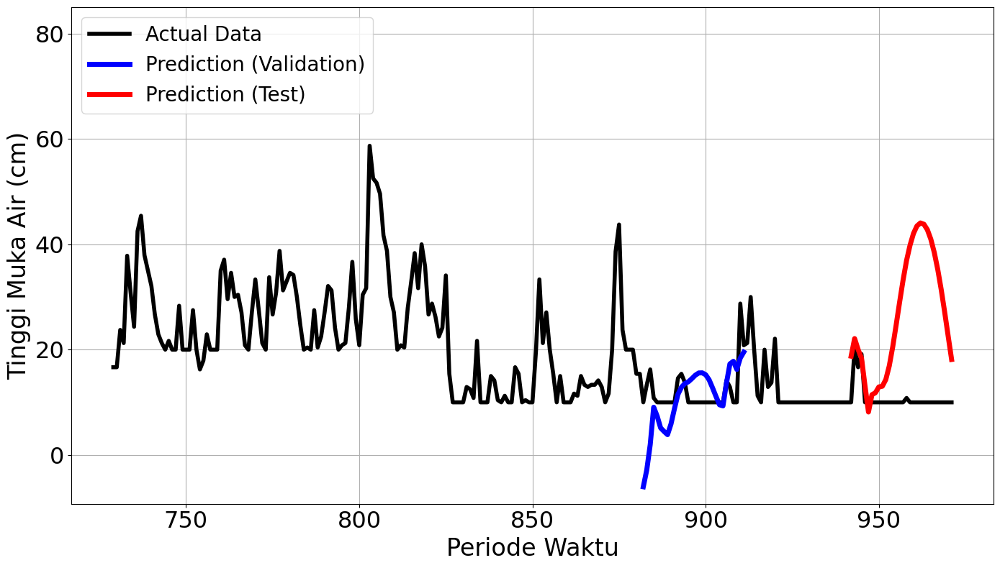

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1288 - val_loss: 0.0190
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0761 - val_loss: 0.0242
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0555 - val_loss: 0.0266
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0300 - val_loss: 0.0262
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - loss: 0.0231 - val_loss: 0.0263
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0190Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0190 - val_loss: 0.0272
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
mape validation = 35.689480216907924 %
mape test = 19.17424921758804 %


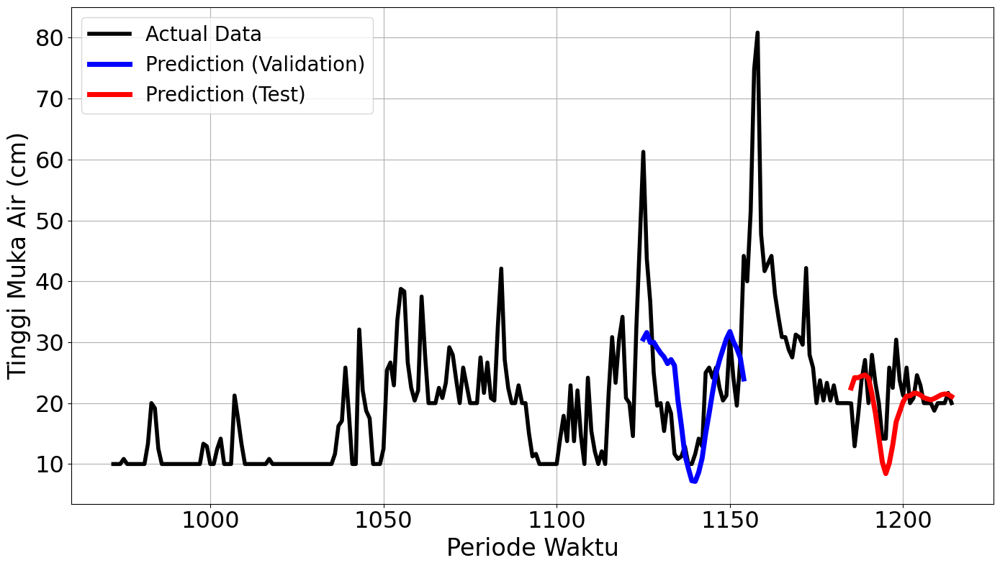

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.6277
Final Average MAPE Test: 1.0141
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1945 - val_loss: 0.0535
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1077 - val_loss: 0.0789
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0564 - val_loss: 0.1024
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0278 - val_loss: 0.1152
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0221 - val_loss: 0.1129
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0216Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0216 - val_loss: 0.0980
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
mape validation = 70.2253616568346 %
mape test = 138.02696936081495 %


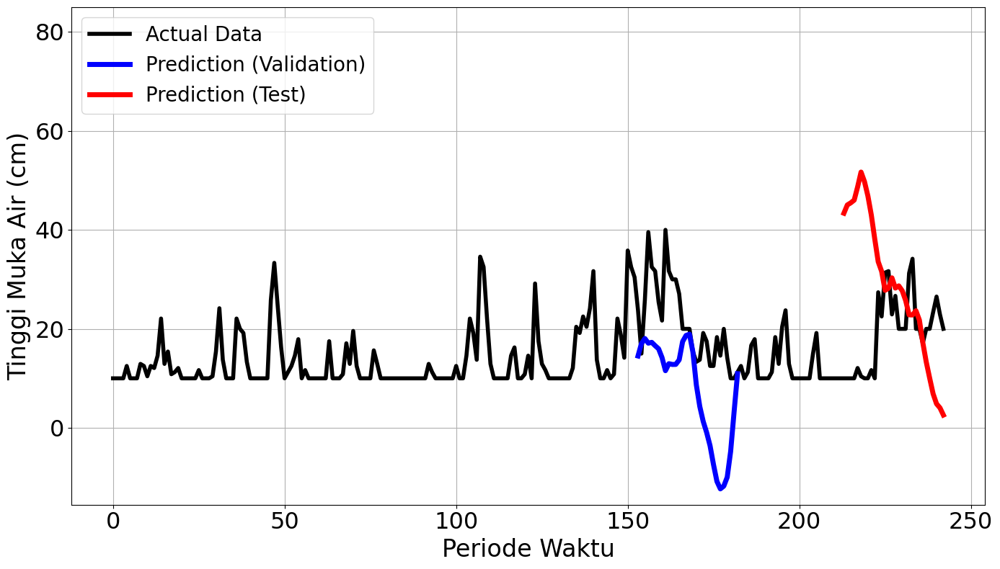

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0421 - val_loss: 0.1900
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0295 - val_loss: 0.1913
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0343 - val_loss: 0.1829
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0302 - val_loss: 0.1708
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0213 - val_loss: 0.1635
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0205 - val_loss: 0.1611
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0148 - val_loss: 0.1601
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0178 - val_loss: 0.1581
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0196 - val_loss: 0.1558
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0153 - val_loss: 0.1536
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0165 - val_loss: 0.1511
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0141 - val_loss: 

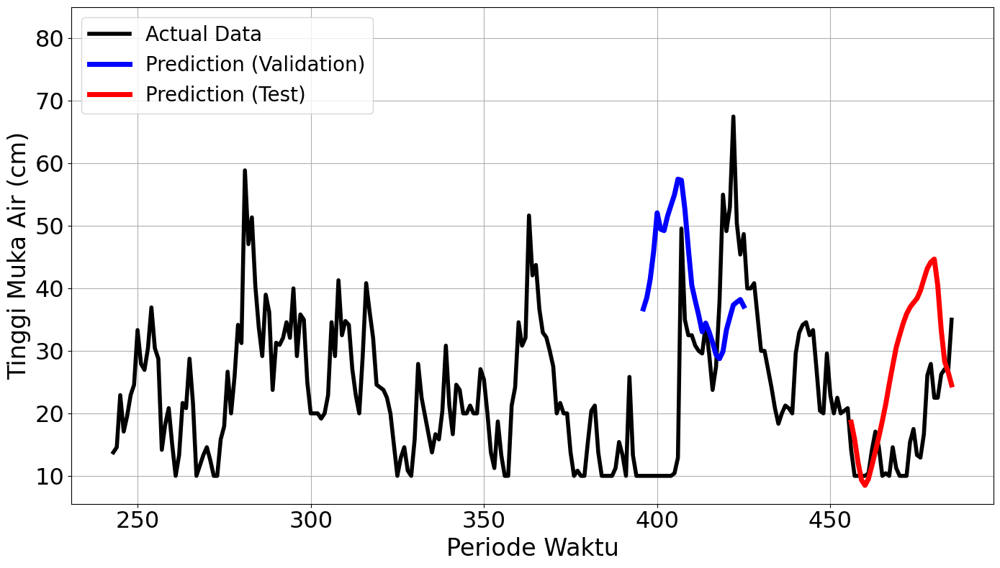

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1632 - val_loss: 0.0044
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step - loss: 0.0862 - val_loss: 0.0067
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0415 - val_loss: 0.0028
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0184 - val_loss: 5.1594e-04
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0203 - val_loss: 8.2984e-04
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0249 - val_loss: 0.0021
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0265 - val_loss: 0.0027
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0220 - val_loss: 0.0022
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0210Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0210 - val_loss: 0.0012
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
mape validation = 13.944682395

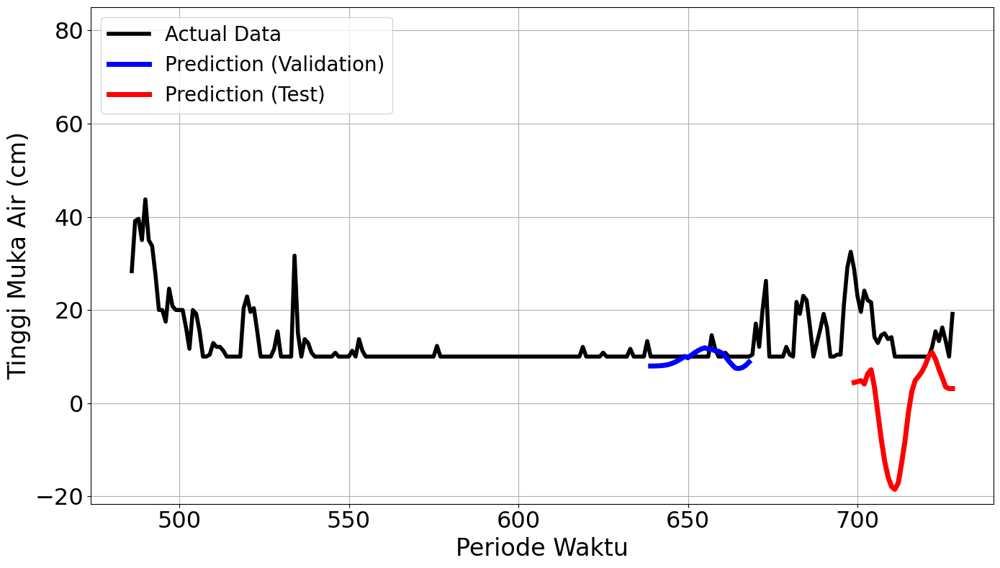

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1128 - val_loss: 0.2447
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step - loss: 0.0578 - val_loss: 0.1851
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0600 - val_loss: 0.1141
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0475 - val_loss: 0.0522
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0327 - val_loss: 0.0165
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0246 - val_loss: 0.0084
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0194 - val_loss: 0.0153
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0222 - val_loss: 0.0253
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - loss: 0.0283 - val_loss: 0.0307
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0281 - val_loss: 0.0309
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0246Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - los

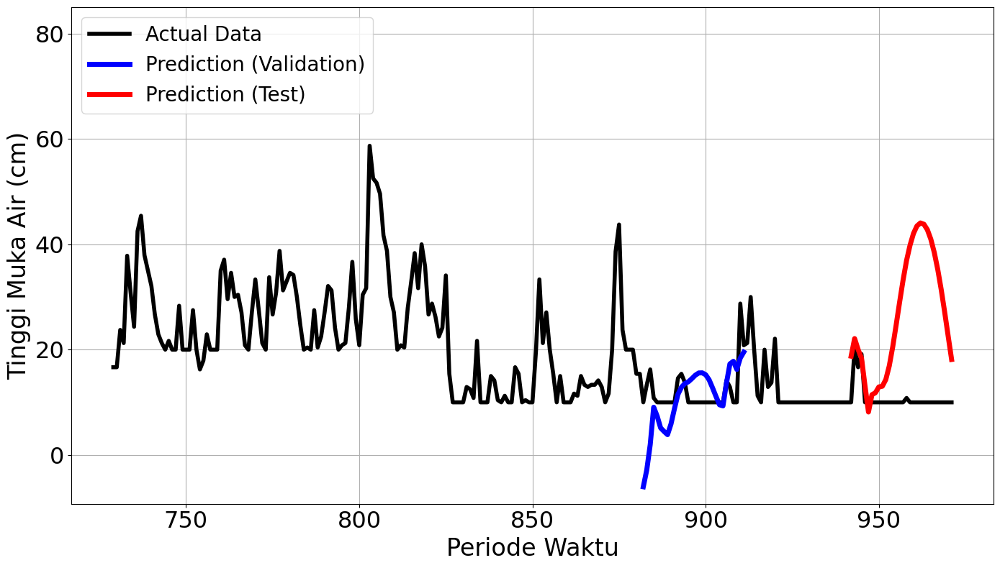

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1288 - val_loss: 0.0190
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0761 - val_loss: 0.0242
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0555 - val_loss: 0.0266
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0300 - val_loss: 0.0262
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0231 - val_loss: 0.0263
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0190Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0190 - val_loss: 0.0272
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
mape validation = 35.689480216907924 %
mape test = 19.17424921758804 %


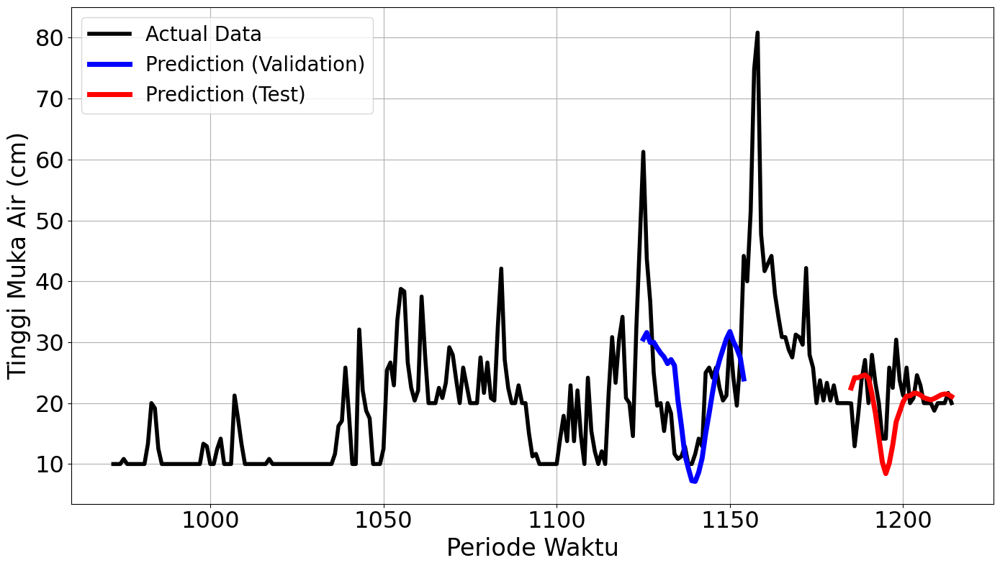

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.6277
Final Average MAPE Test: 1.0141
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 0.1148 - val_loss: 0.2018
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0371 - val_loss: 0.0764
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0269 - val_loss: 0.0115
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - val_loss: 0.0176
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0104 - val_loss: 0.0129
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0087 - val_loss: 0.0249
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0092 - val_loss: 0.0186
Epoch 8/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0103Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0099 - val_loss: 0.0216
Epoch 00008: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
mape validation = 33.36613899580398 %
mape test = 31.769564438773106 %


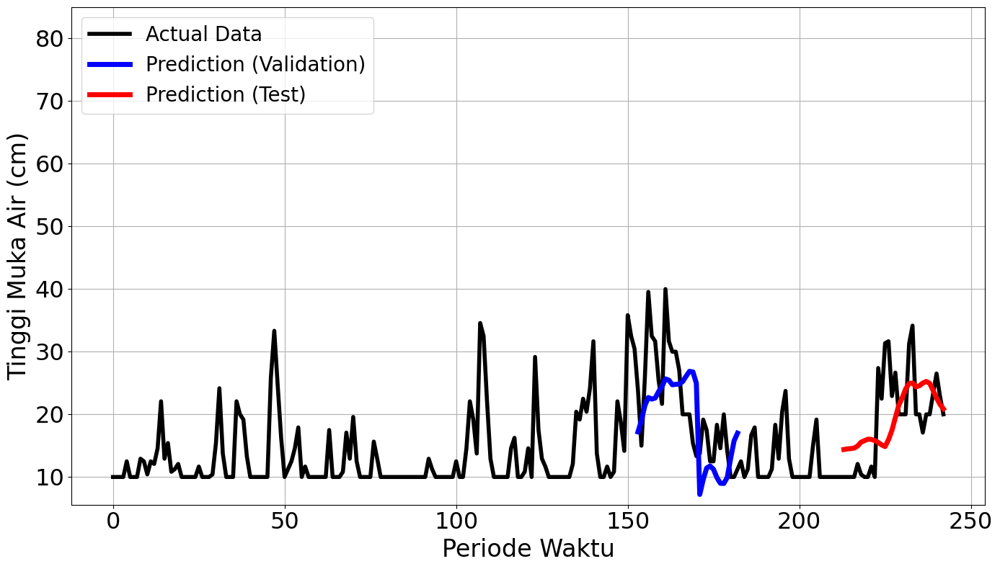

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.0594 - val_loss: 0.0819
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0321 - val_loss: 0.0347
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0308 - val_loss: 0.0450
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0119 - val_loss: 0.0318
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0130 - val_loss: 0.0358
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0181 - val_loss: 0.0282
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0133 - val_loss: 0.0258
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0126 - val_loss: 0.0255
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0172 - val_loss: 0.0257
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0117 - val_loss: 0.0297
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0130 - val_loss: 0.0286
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0093 - val_loss: 0.0221
E

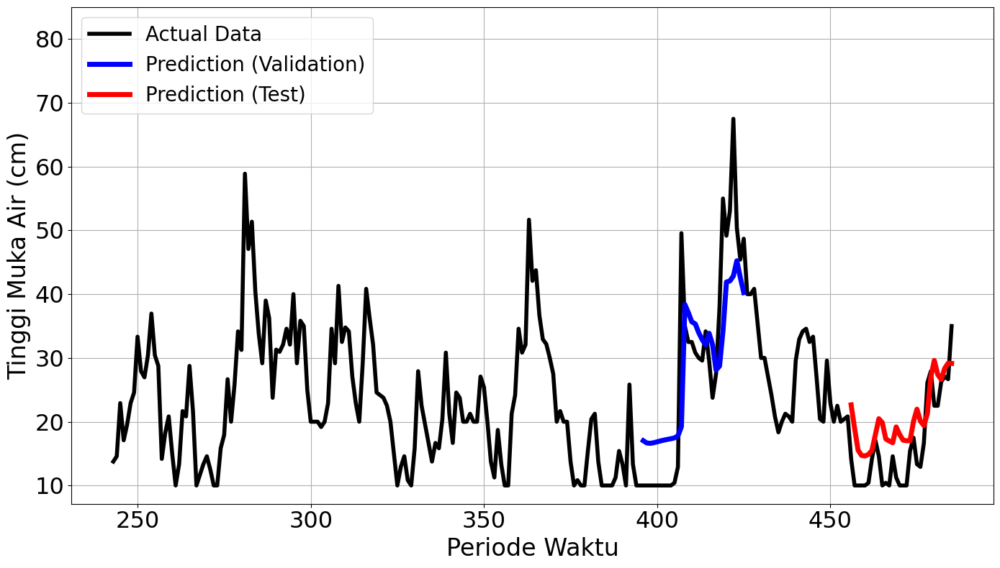

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 0.0456 - val_loss: 0.0357
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0536 - val_loss: 1.6015e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0260 - val_loss: 0.0010
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0118 - val_loss: 0.0058
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - val_loss: 2.0956e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0058 - val_loss: 0.0021
Epoch 7/150
4/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0025Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0031 - val_loss: 2.3165e-04
Epoch 00007: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 259ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
mape validation = 5.262881039480349 %
mape test = 103.43287678524078 %


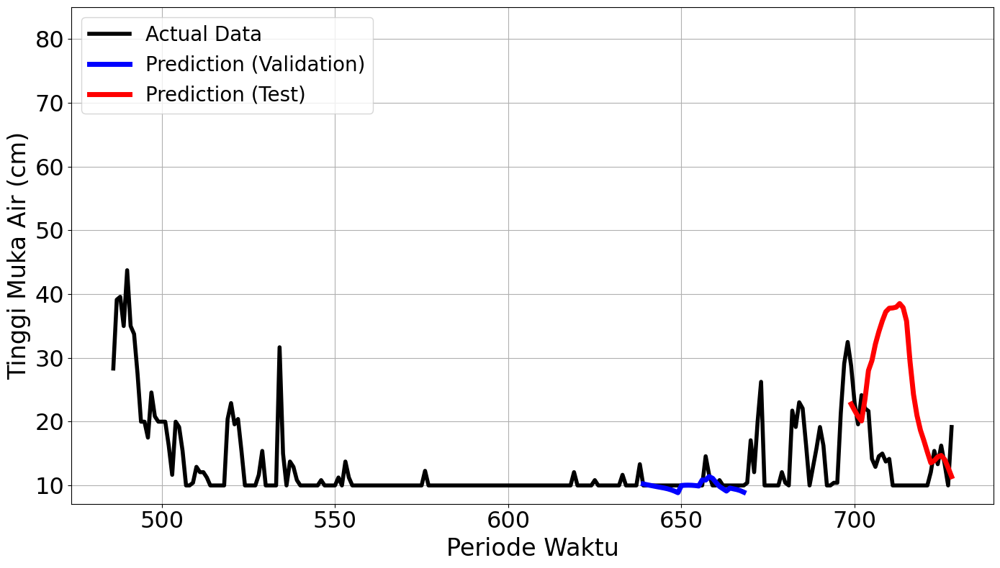

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.1621 - val_loss: 0.0288
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0308 - val_loss: 0.0118
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0149 - val_loss: 0.0044
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0186 - val_loss: 0.0089
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0169 - val_loss: 0.0096
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0159 - val_loss: 0.0104
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0186 - val_loss: 0.0035
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0175 - val_loss: 0.0039
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0121 - val_loss: 0.0031
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0199 - val_loss: 0.0032
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0121 - val_loss: 0.0039
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - val_loss: 0.0032
E

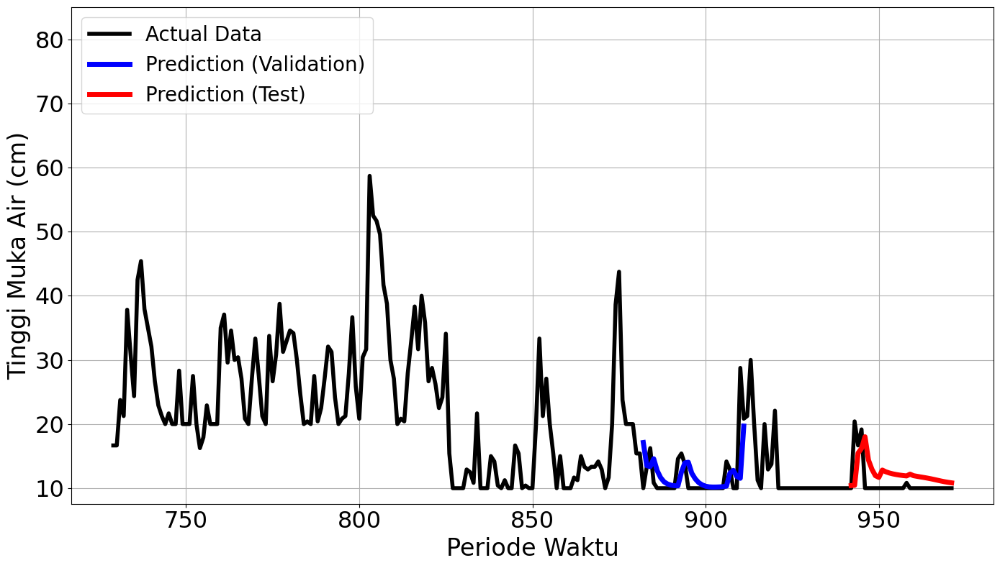

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0965 - val_loss: 0.1185
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0636 - val_loss: 0.0289
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0116 - val_loss: 0.0259
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0089 - val_loss: 0.0246
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0089 - val_loss: 0.0268
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0112 - val_loss: 0.0254
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0089 - val_loss: 0.0250
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0084 - val_loss: 0.0240
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0106 - val_loss: 0.0228
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0109 - val_loss: 0.0219
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0064 - val_loss: 0.0216
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0060 - val_loss: 0.0209
E

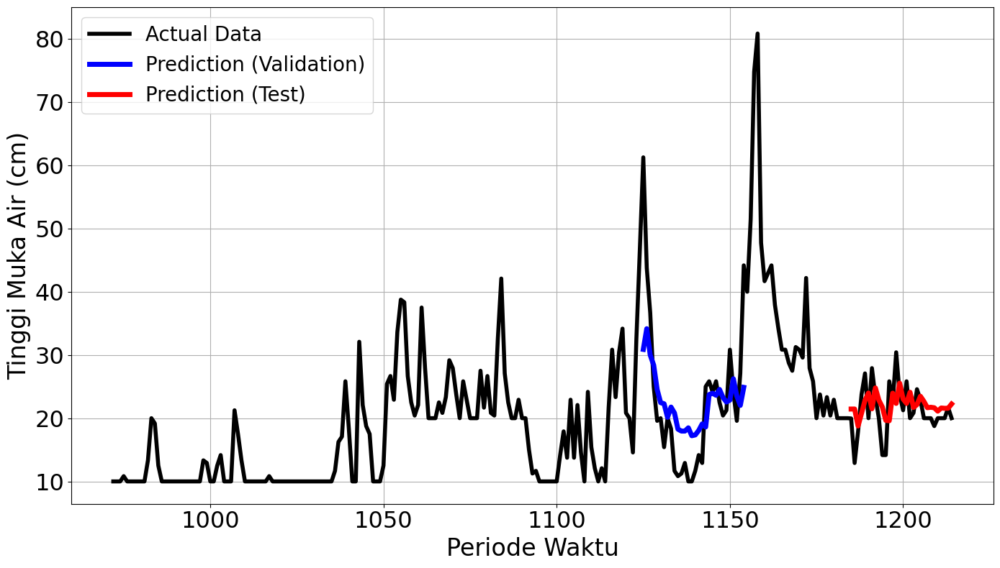

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2440
Final Average MAPE Test: 0.4234
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1148 - val_loss: 0.2018
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0371 - val_loss: 0.0764
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0269 - val_loss: 0.0115
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - val_loss: 0.0176
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - val_loss: 0.0129
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0087 - val_loss: 0.0249
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0092 - val_loss: 0.0186
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0100 Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - val_loss: 0.0216
Epoch 00008: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
mape validation = 33.36613899580398 %
mape test = 31.769564438773106 %


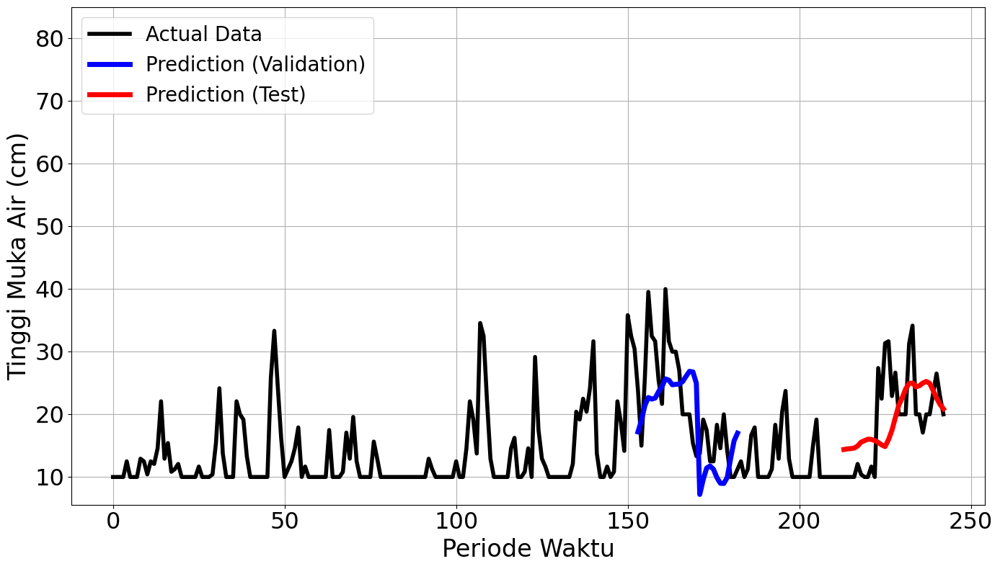

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.0594 - val_loss: 0.0819
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0321 - val_loss: 0.0347
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0308 - val_loss: 0.0450
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0119 - val_loss: 0.0318
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0130 - val_loss: 0.0358
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0181 - val_loss: 0.0282
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0133 - val_loss: 0.0258
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0126 - val_loss: 0.0255
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0172 - val_loss: 0.0257
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0117 - val_loss: 0.0297
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0130 - val_loss: 0.0286
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0093 - val_loss: 0.0221
E

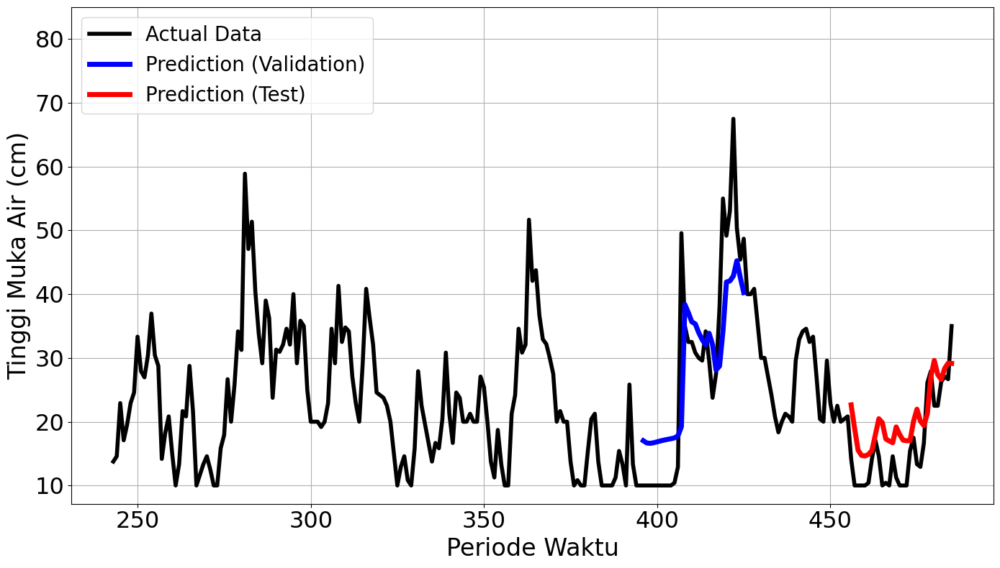

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0456 - val_loss: 0.0357
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0536 - val_loss: 1.6015e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0260 - val_loss: 0.0010
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0118 - val_loss: 0.0058
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0068 - val_loss: 2.0956e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0058 - val_loss: 0.0021
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0029Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0031 - val_loss: 2.3165e-04
Epoch 00007: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
mape validation = 5.262881039480349 %
mape test = 103.43287678524078 %


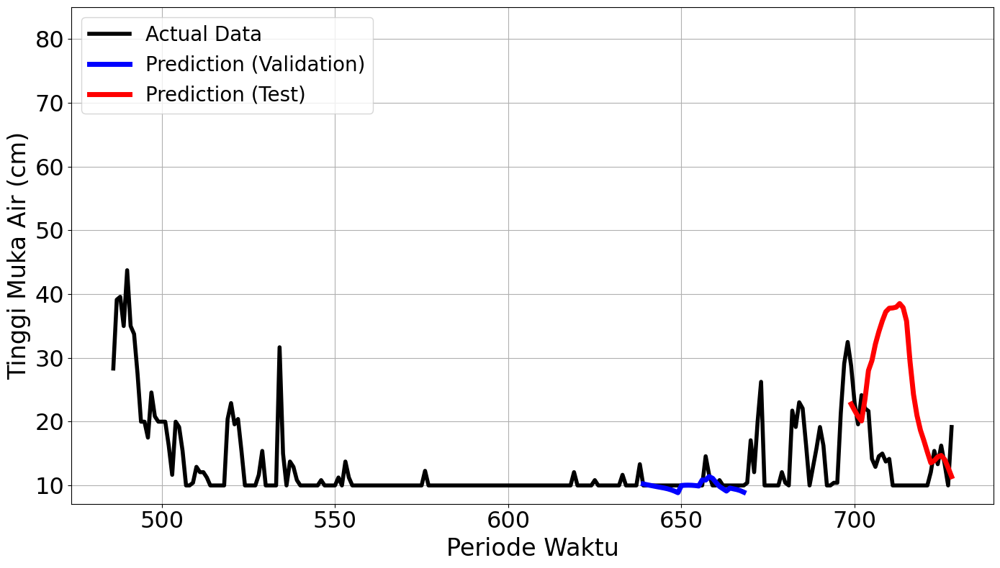

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.1621 - val_loss: 0.0288
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0308 - val_loss: 0.0118
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0149 - val_loss: 0.0044
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186 - val_loss: 0.0089
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0169 - val_loss: 0.0096
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0159 - val_loss: 0.0104
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0186 - val_loss: 0.0035
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0175 - val_loss: 0.0039
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0121 - val_loss: 0.0031
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0199 - val_loss: 0.0032
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0121 - val_loss: 0.0039
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0096 - val_loss: 0.0032
E

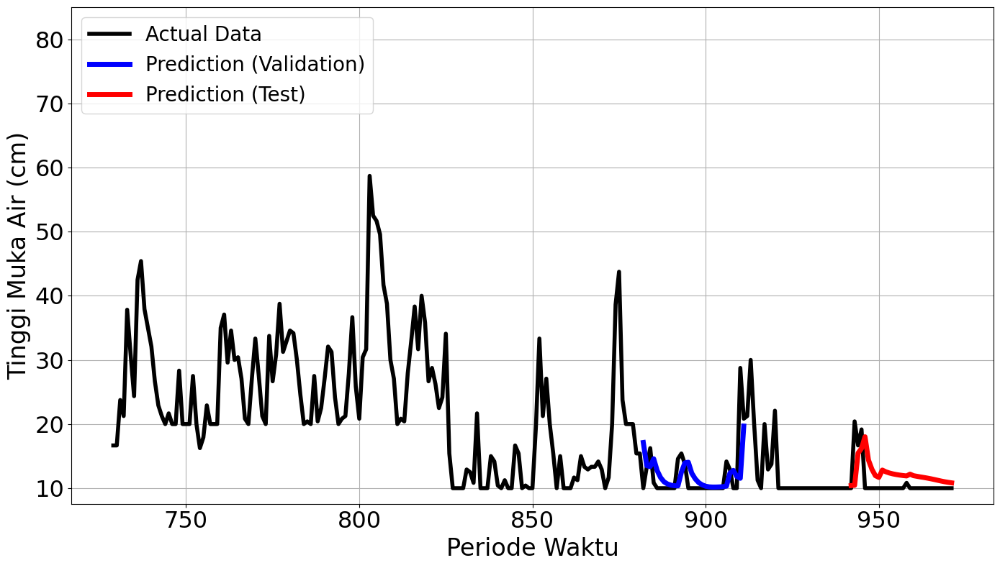

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.0965 - val_loss: 0.1185
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0636 - val_loss: 0.0289
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0116 - val_loss: 0.0259
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - val_loss: 0.0246
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0089 - val_loss: 0.0268
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0112 - val_loss: 0.0254
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0089 - val_loss: 0.0250
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0084 - val_loss: 0.0240
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - val_loss: 0.0228
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0109 - val_loss: 0.0219
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0064 - val_loss: 0.0216
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0060 - val_loss: 0.0209
E

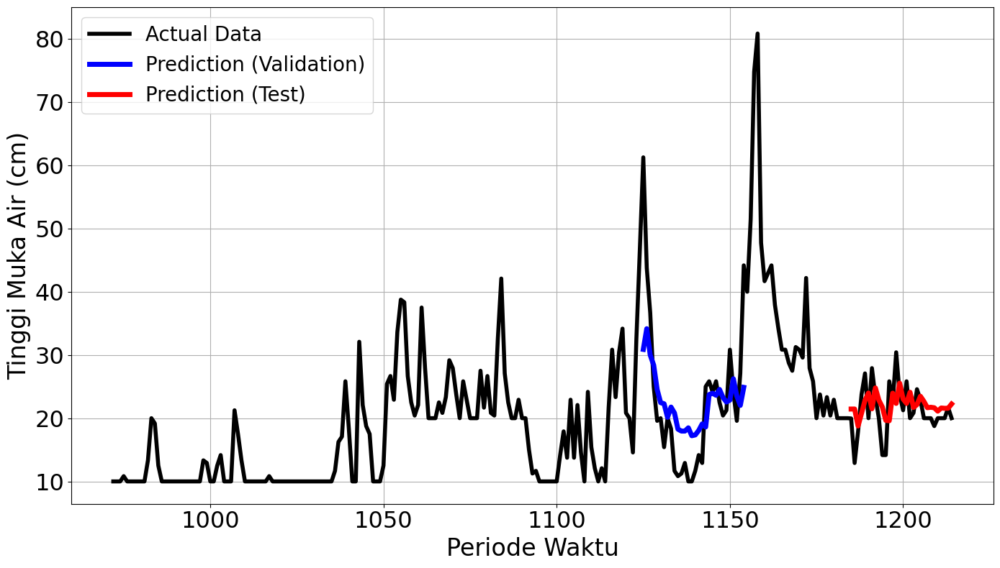

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2440
Final Average MAPE Test: 0.4234
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 274ms/step - loss: 0.0623 - val_loss: 0.0136
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0275 - val_loss: 0.0876
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0141 - val_loss: 0.1268
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - val_loss: 0.0581
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0101 - val_loss: 0.0320
Epoch 6/150
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0046Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0063 - val_loss: 0.0257
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
mape validation = 35.43583703506253 %
mape test = 57.5326926507462 %


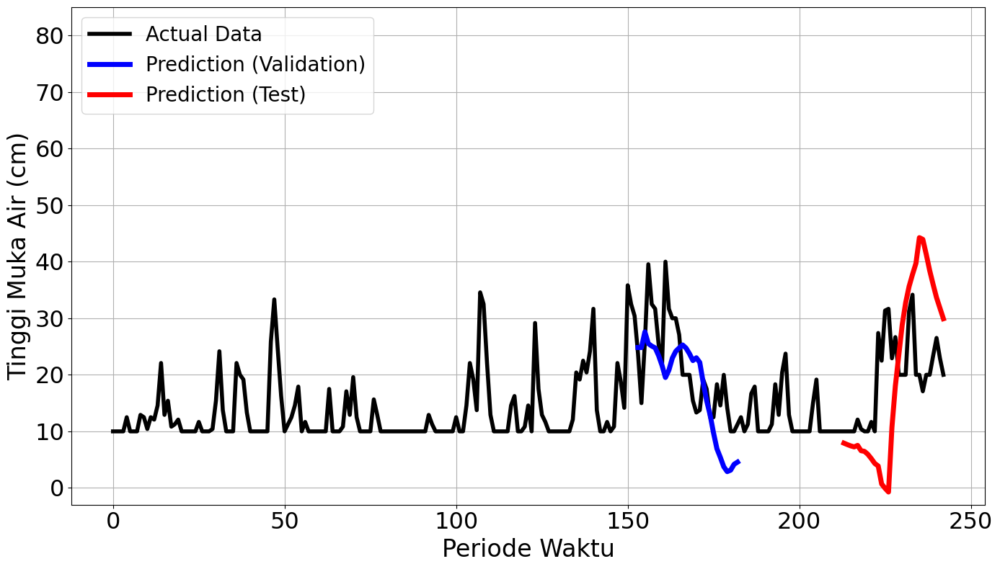

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step - loss: 0.0584 - val_loss: 0.2732
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0314 - val_loss: 0.1657
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0176 - val_loss: 0.1037
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0346 - val_loss: 0.0951
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0212 - val_loss: 0.0921
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0204 - val_loss: 0.0577
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0153 - val_loss: 0.0411
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0177 - val_loss: 0.0370
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0171 - val_loss: 0.0343
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0135 - val_loss: 0.0410
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0130 - val_loss: 0.0439
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - val_loss: 0.0465


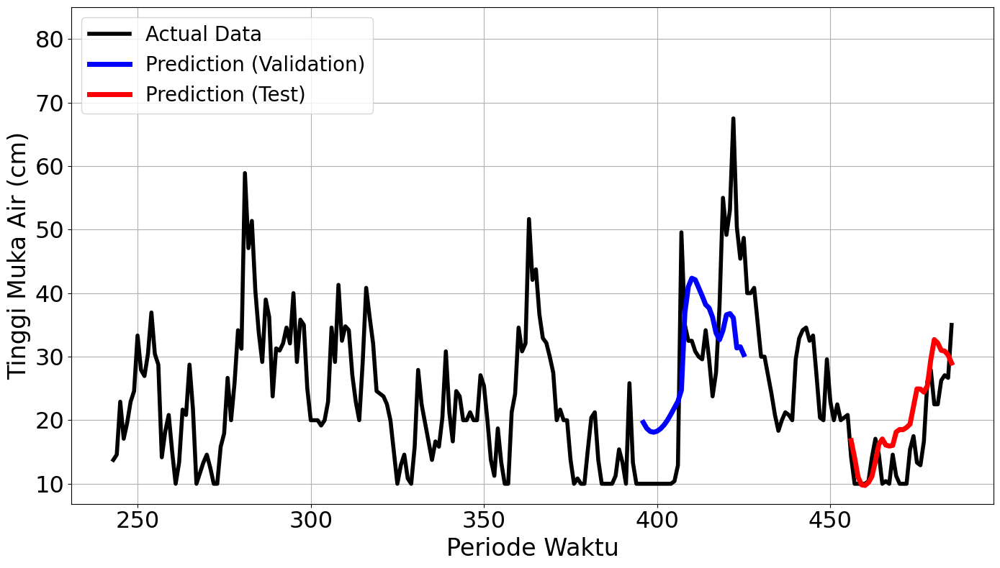

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - loss: 0.0379 - val_loss: 0.0234
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0309 - val_loss: 0.0354
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0237 - val_loss: 0.0062
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0072 - val_loss: 0.0084
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0092 - val_loss: 0.0057
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0058 - val_loss: 0.0043
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0106 - val_loss: 0.0012
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0073 - val_loss: 9.3562e-04
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0028 - val_loss: 0.0030
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0036 - val_loss: 3.3421e-04
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0032 - val_loss: 0.0029
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0049 - val_loss:

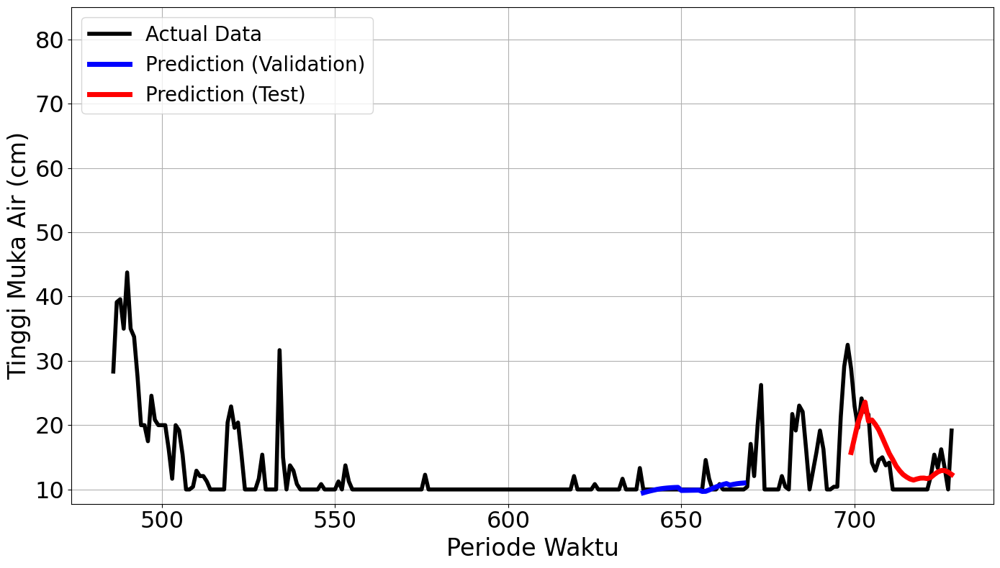

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 0.1097 - val_loss: 0.2331
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0570 - val_loss: 0.0595
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0374 - val_loss: 0.0245
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0303 - val_loss: 0.0303
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0167 - val_loss: 0.0123
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0191 - val_loss: 0.0145
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0231 - val_loss: 0.0104
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0194 - val_loss: 0.0108
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0153 - val_loss: 0.0154
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0134 - val_loss: 0.0099
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0124 - val_loss: 0.0070
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0113 - val_loss: 0.0069


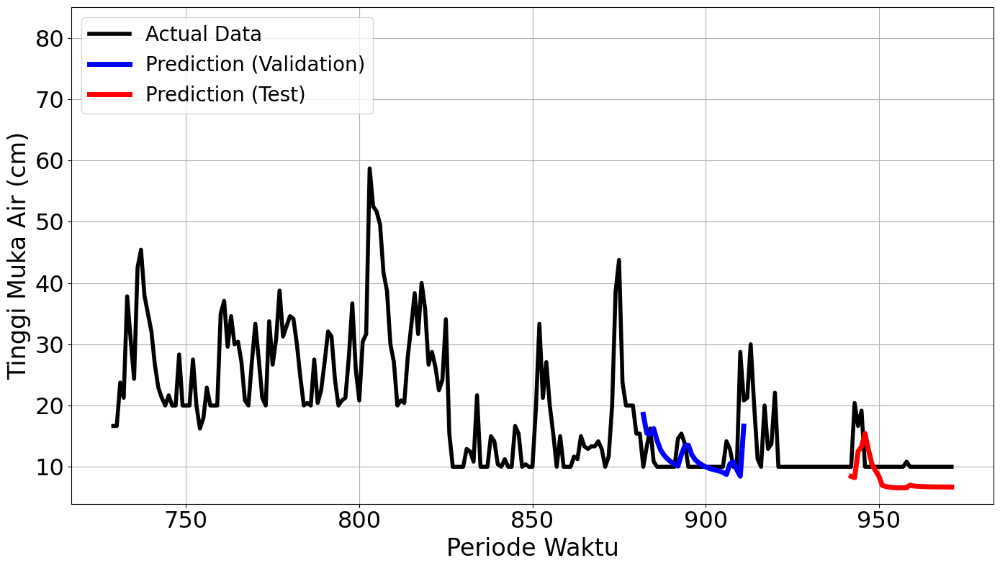

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 189ms/step - loss: 0.1587 - val_loss: 0.1058
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0276 - val_loss: 0.2221
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.1058 - val_loss: 0.0519
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0278 - val_loss: 0.0418
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0218 - val_loss: 0.0455
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0188 - val_loss: 0.0324
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0157 - val_loss: 0.0360
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0178 - val_loss: 0.0313
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0144 - val_loss: 0.0269
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0091 - val_loss: 0.0269
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0091 - val_loss: 0.0265
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - val_loss: 0.0259


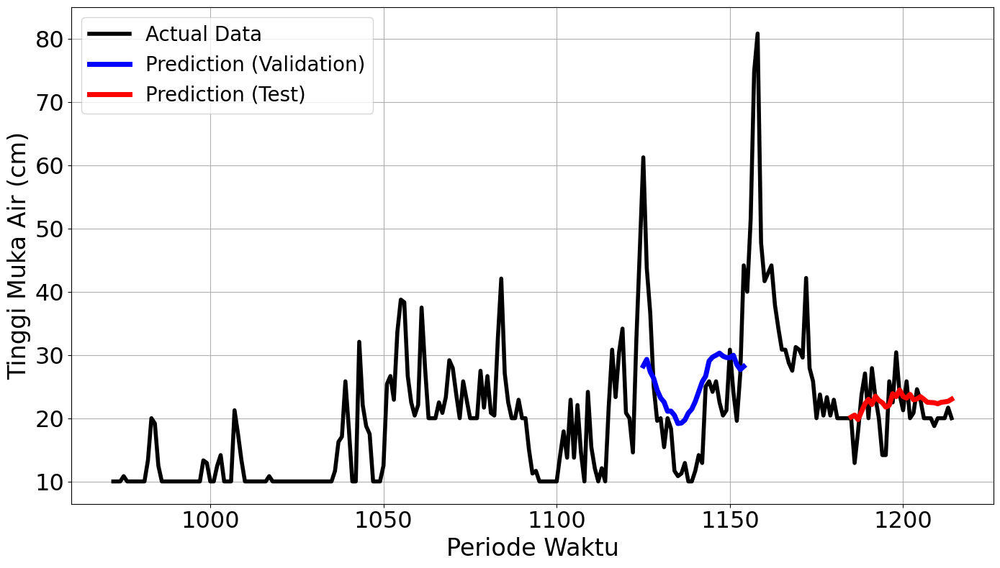

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3124
Final Average MAPE Test: 0.3243
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0623 - val_loss: 0.0136
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0275 - val_loss: 0.0876
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0141 - val_loss: 0.1268
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - val_loss: 0.0581
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0101 - val_loss: 0.0320
Epoch 6/150
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0046Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0063 - val_loss: 0.0257
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
mape validation = 35.43583703506253 %
mape test = 57.5326926507462 %


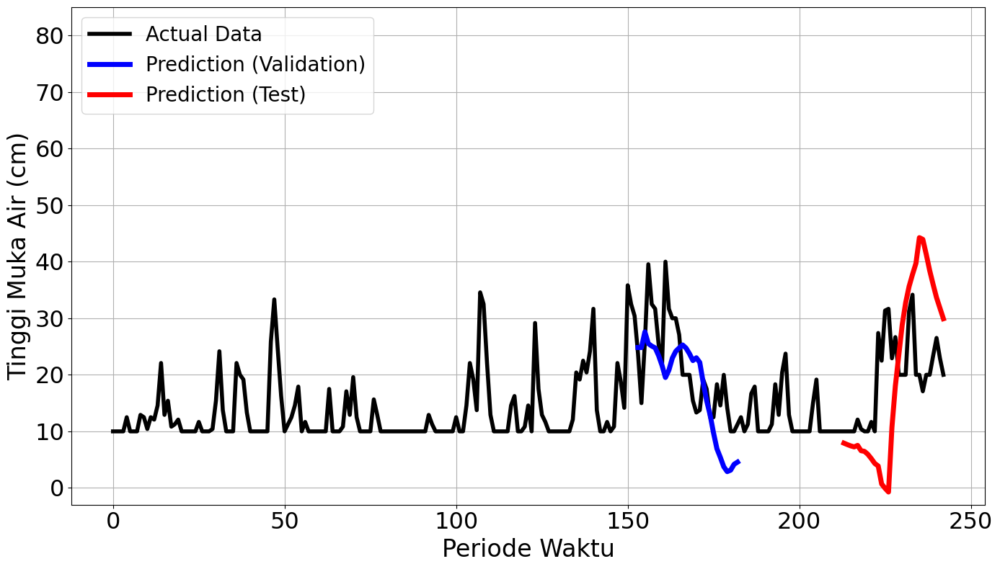

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 177ms/step - loss: 0.0584 - val_loss: 0.2732
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0314 - val_loss: 0.1657
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0176 - val_loss: 0.1037
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0346 - val_loss: 0.0951
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0212 - val_loss: 0.0921
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0204 - val_loss: 0.0577
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0153 - val_loss: 0.0411
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0177 - val_loss: 0.0370
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0171 - val_loss: 0.0343
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0135 - val_loss: 0.0410
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0130 - val_loss: 0.0439
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0099 - val_loss: 0.0465


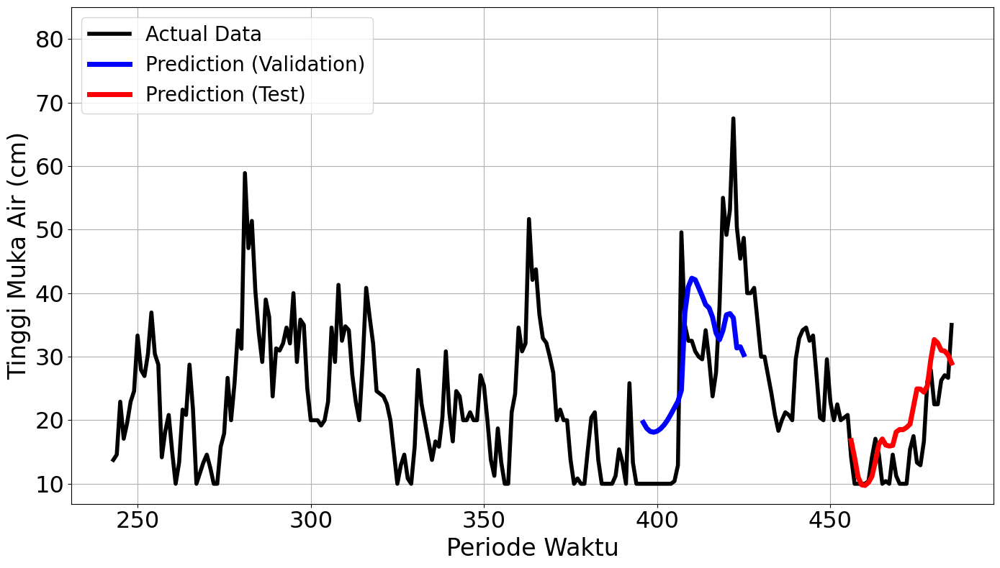

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 178ms/step - loss: 0.0379 - val_loss: 0.0234
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0309 - val_loss: 0.0354
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0237 - val_loss: 0.0062
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0072 - val_loss: 0.0084
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0092 - val_loss: 0.0057
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0058 - val_loss: 0.0043
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0106 - val_loss: 0.0012
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0073 - val_loss: 9.3562e-04
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0028 - val_loss: 0.0030
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0036 - val_loss: 3.3421e-04
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0032 - val_loss: 0.0029
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0049 - val_loss:

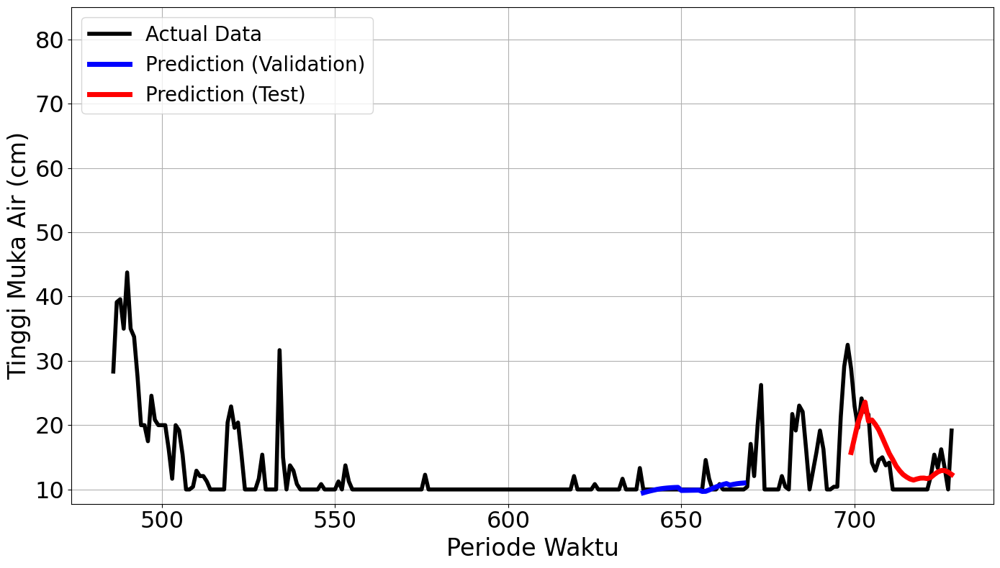

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 198ms/step - loss: 0.1097 - val_loss: 0.2331
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0570 - val_loss: 0.0595
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0374 - val_loss: 0.0245
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0303 - val_loss: 0.0303
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0167 - val_loss: 0.0123
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0191 - val_loss: 0.0145
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0231 - val_loss: 0.0104
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0194 - val_loss: 0.0108
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0153 - val_loss: 0.0154
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0134 - val_loss: 0.0099
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0124 - val_loss: 0.0070
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0113 - val_loss: 0.0069


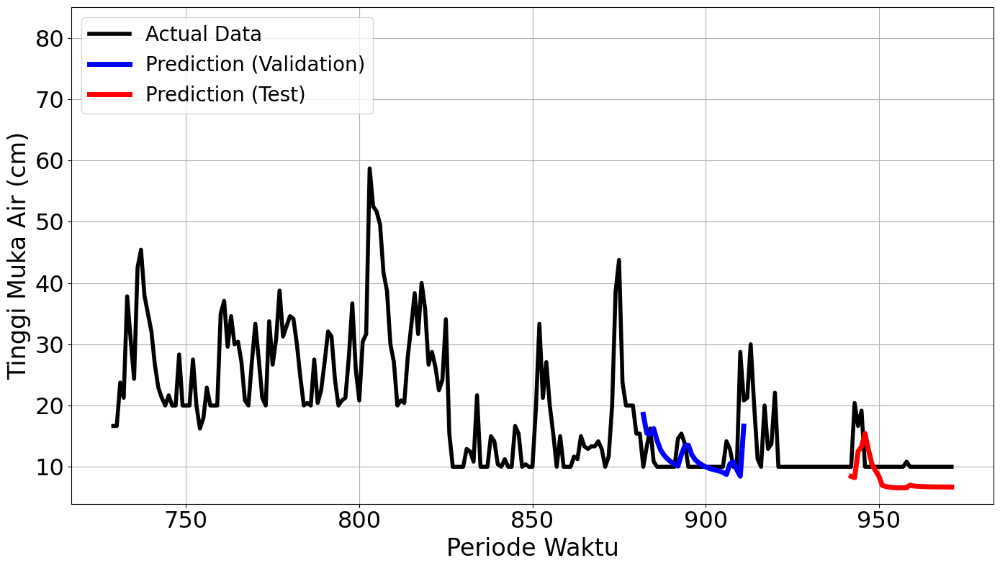

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.1587 - val_loss: 0.1058
Epoch 2/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0276 - val_loss: 0.2221
Epoch 3/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1058 - val_loss: 0.0519
Epoch 4/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0278 - val_loss: 0.0418
Epoch 5/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0218 - val_loss: 0.0455
Epoch 6/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0188 - val_loss: 0.0324
Epoch 7/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0157 - val_loss: 0.0360
Epoch 8/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0178 - val_loss: 0.0313
Epoch 9/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0144 - val_loss: 0.0269
Epoch 10/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0091 - val_loss: 0.0269
Epoch 11/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0091 - val_loss: 0.0265
Epoch 12/150
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - val_loss: 0.0259


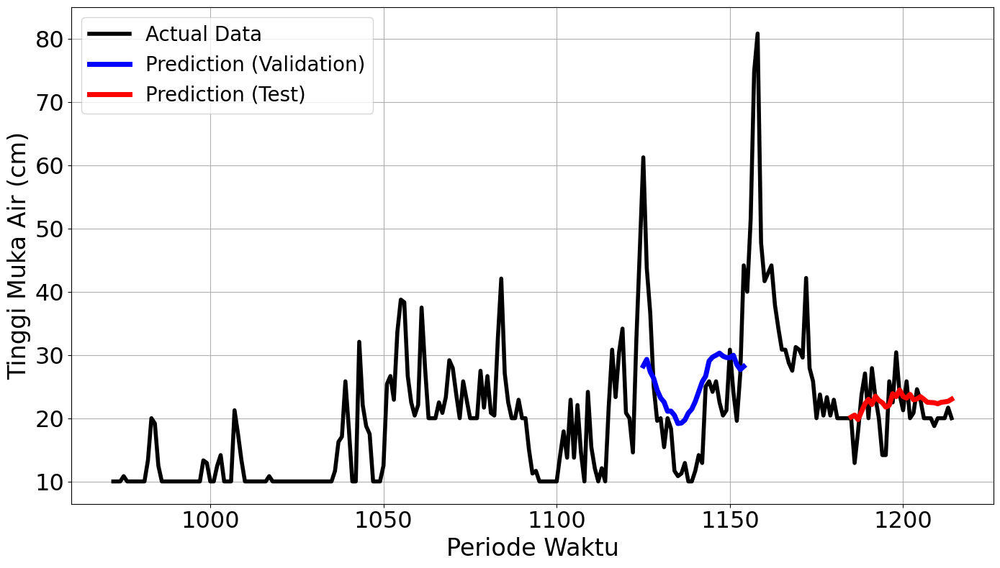

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3124
Final Average MAPE Test: 0.3243
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 592ms/step - loss: 0.2017 - val_loss: 0.1516
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0277 - val_loss: 0.0814
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0256 - val_loss: 0.0607
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0127 - val_loss: 0.0842
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0142 - val_loss: 0.0970
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0085 - val_loss: 0.0752
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0123 - val_loss: 0.0654
Epoch 8/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0072 - val_loss: 0.0615
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
mape validation = 58.67222293067867 %
mape test = 32.17720079913021 %


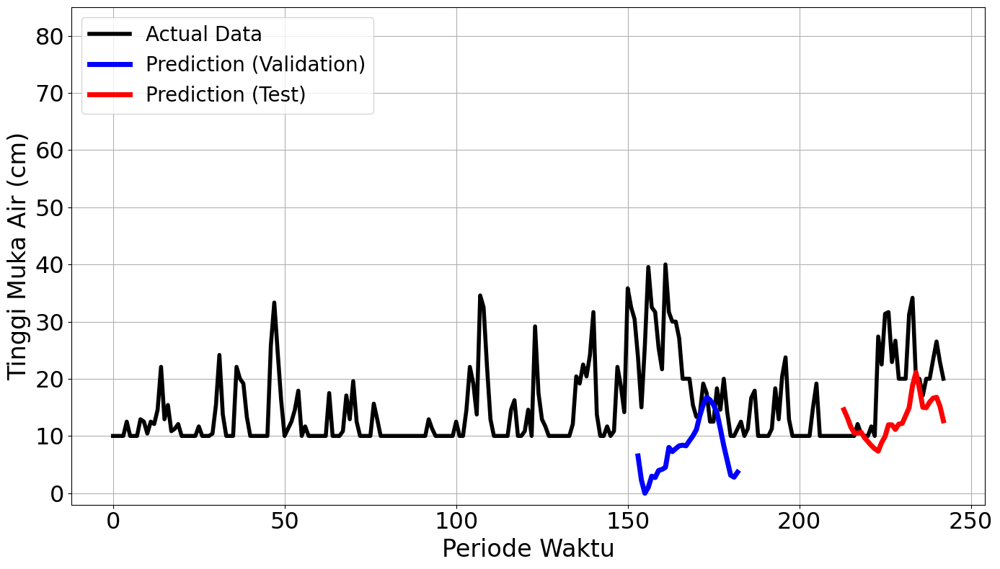

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 505ms/step - loss: 0.0525 - val_loss: 0.0620
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0503 - val_loss: 0.0657
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0407 - val_loss: 0.0474
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0334 - val_loss: 0.0405
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0263 - val_loss: 0.0519
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0254 - val_loss: 0.0426
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0202 - val_loss: 0.0376
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0170 - val_loss: 0.0365
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0199 - val_loss: 0.0366
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0172 - val_loss: 0.0393
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0175 - val_loss: 0.0354
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0234 - val_loss: 0.0310

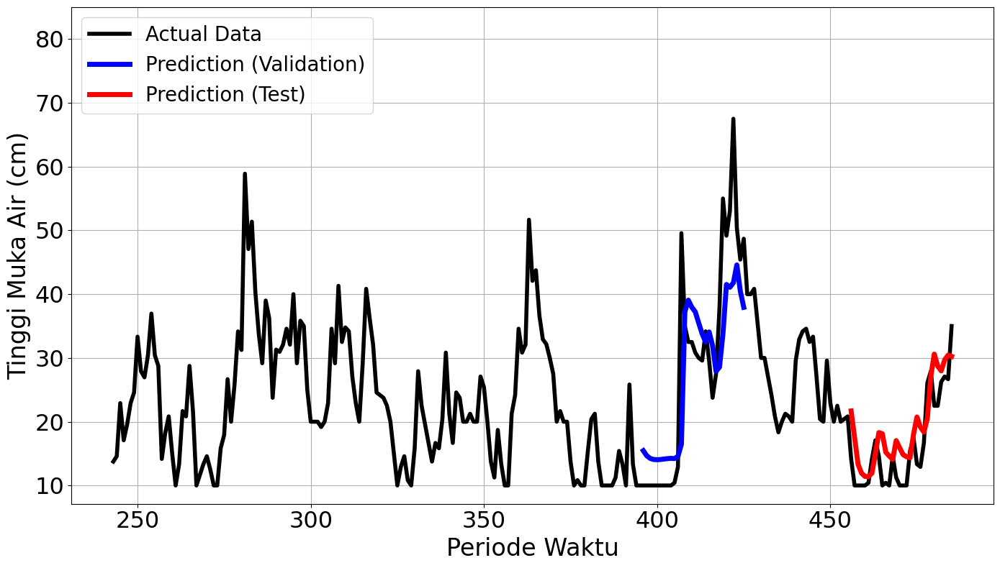

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 600ms/step - loss: 0.1999 - val_loss: 0.0090
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0564 - val_loss: 0.0101
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0108 - val_loss: 0.0076
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0112 - val_loss: 0.0018
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0132 - val_loss: 0.0036
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0058 - val_loss: 0.0159
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0059 - val_loss: 0.0022
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0044 - val_loss: 0.0022
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0028 - val_loss: 0.0011
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0051 - val_loss: 0.0013
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0025 - val_loss: 4.9672e-04
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0030 - val_loss: 0

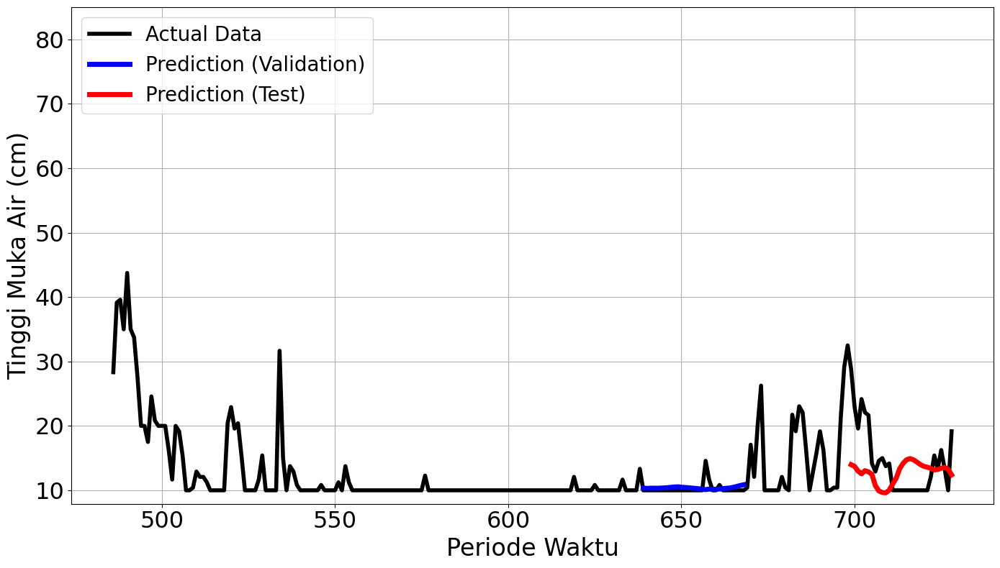

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 502ms/step - loss: 0.1562 - val_loss: 0.3098
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1682 - val_loss: 0.0215
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0217 - val_loss: 0.0197
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0225 - val_loss: 0.0141
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0218 - val_loss: 0.0060
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0141 - val_loss: 0.0059
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0156 - val_loss: 0.0067
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0143 - val_loss: 0.0043
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0153 - val_loss: 0.0041
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0176 - val_loss: 0.0040
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0136 - val_loss: 0.0042
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0167 - val_loss: 0.0068


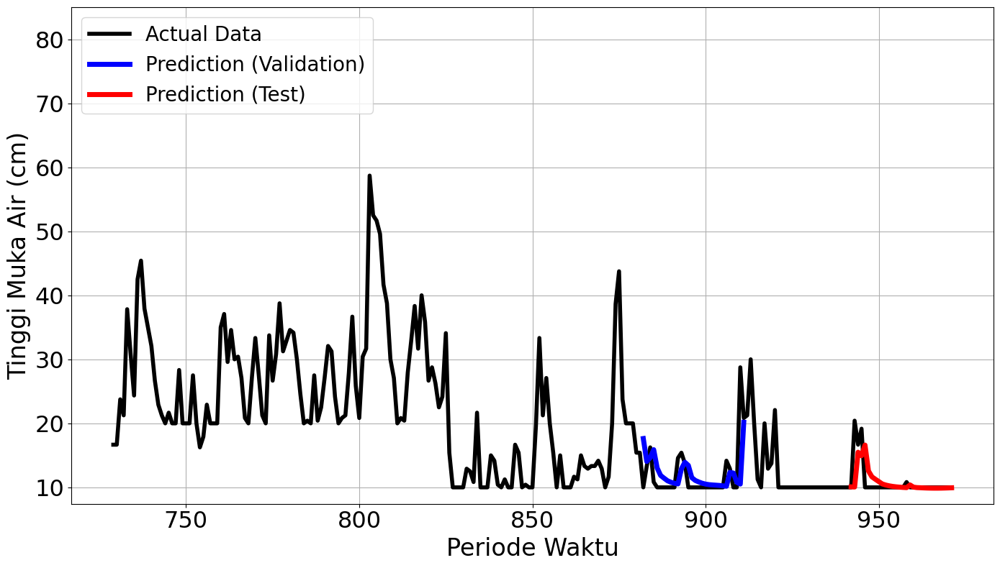

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 525ms/step - loss: 0.1187 - val_loss: 0.0562
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0266 - val_loss: 0.1441
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.1701 - val_loss: 0.0469
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0145 - val_loss: 0.0658
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0249 - val_loss: 0.0361
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0093 - val_loss: 0.0237
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0104 - val_loss: 0.0226
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0123 - val_loss: 0.0221
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0066 - val_loss: 0.0225
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0103 - val_loss: 0.0221
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0076 - val_loss: 0.0212
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0091 - val_loss: 0.020

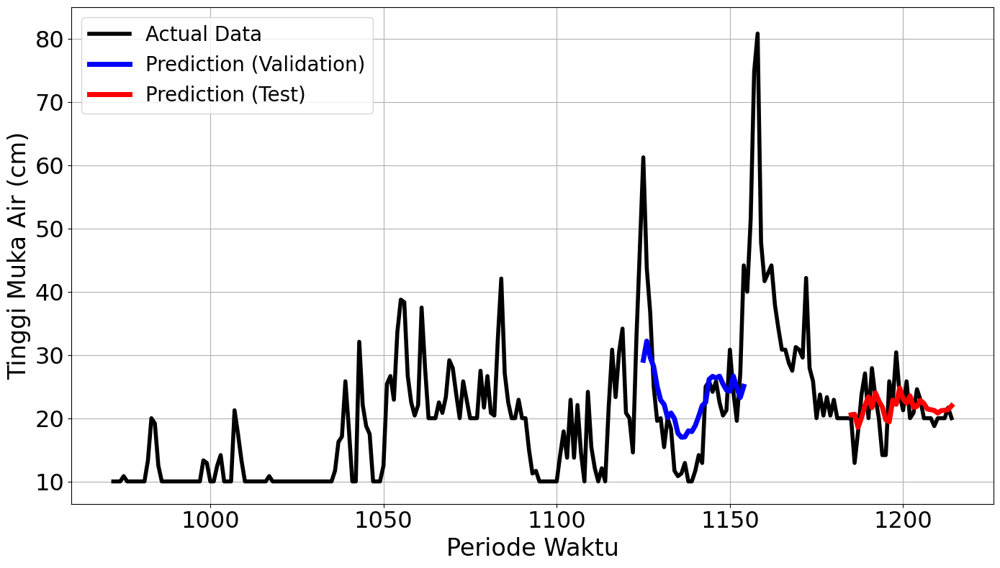

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2810
Final Average MAPE Test: 0.2309
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 511ms/step - loss: 0.2017 - val_loss: 0.1516
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0277 - val_loss: 0.0814
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0256 - val_loss: 0.0607
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0127 - val_loss: 0.0842
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0142 - val_loss: 0.0970
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0085 - val_loss: 0.0752
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0123 - val_loss: 0.0654
Epoch 8/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0072 - val_loss: 0.0615
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
mape validation = 58.67222293067867 %
mape test = 32.17720079913021 %


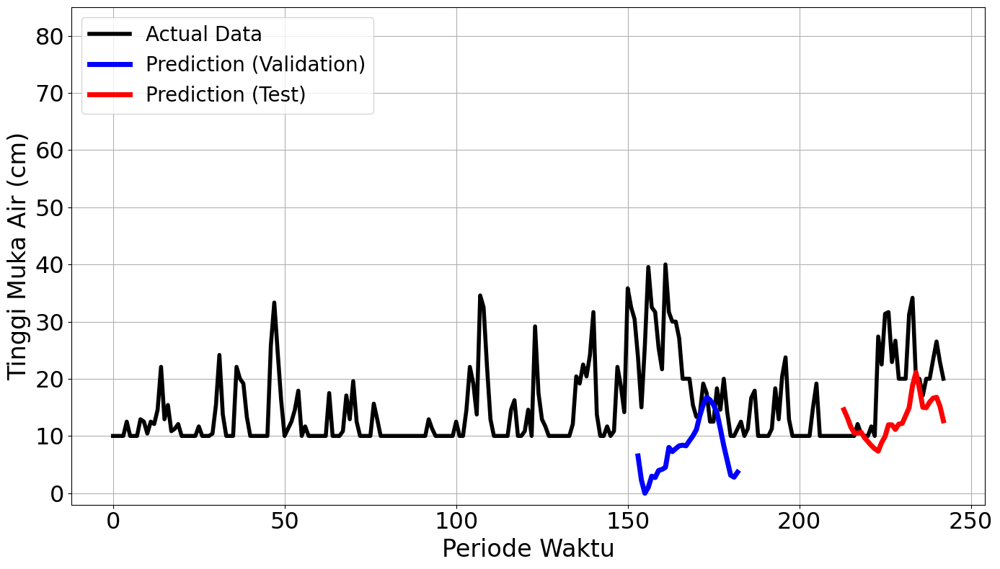

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 500ms/step - loss: 0.0525 - val_loss: 0.0620
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0503 - val_loss: 0.0657
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0407 - val_loss: 0.0474
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0334 - val_loss: 0.0405
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0263 - val_loss: 0.0519
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0254 - val_loss: 0.0426
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0202 - val_loss: 0.0376
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0170 - val_loss: 0.0365
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0199 - val_loss: 0.0366
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0172 - val_loss: 0.0393
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0175 - val_loss: 0.0354
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0234 - val_loss: 0.031

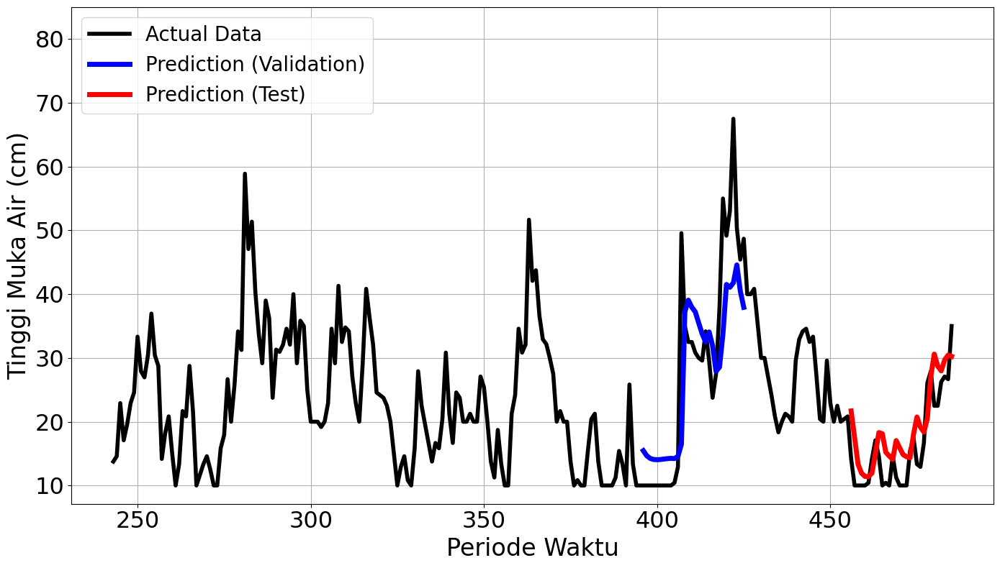

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 459ms/step - loss: 0.1999 - val_loss: 0.0090
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0564 - val_loss: 0.0101
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0108 - val_loss: 0.0076
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0112 - val_loss: 0.0018
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0132 - val_loss: 0.0036
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0058 - val_loss: 0.0159
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0059 - val_loss: 0.0022
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0044 - val_loss: 0.0022
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0028 - val_loss: 0.0011
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0051 - val_loss: 0.0013
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0025 - val_loss: 4.9672e-04
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0030 - val_loss: 0.0

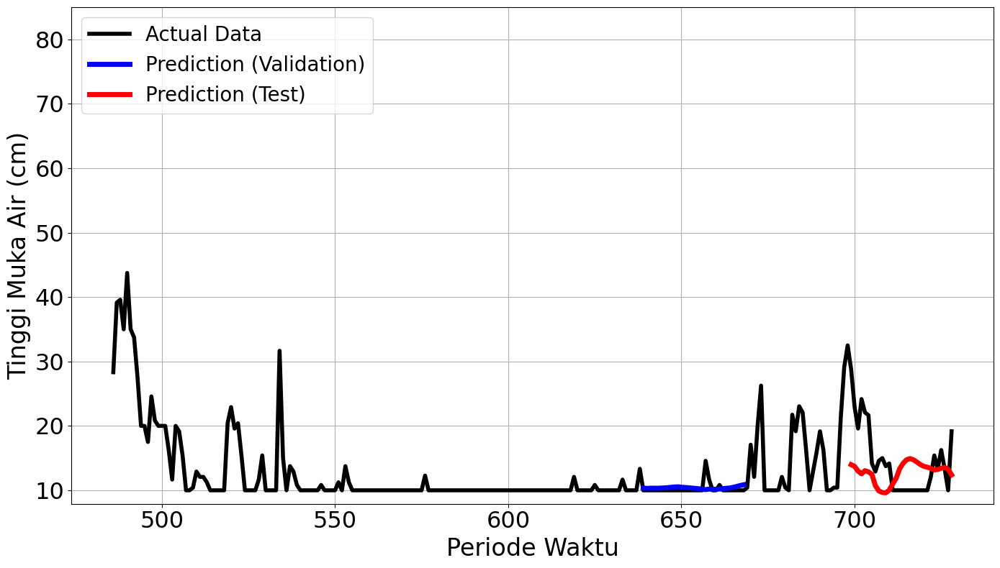

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 626ms/step - loss: 0.1562 - val_loss: 0.3098
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.1682 - val_loss: 0.0215
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0217 - val_loss: 0.0197
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0225 - val_loss: 0.0141
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0218 - val_loss: 0.0060
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0141 - val_loss: 0.0059
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0156 - val_loss: 0.0067
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0143 - val_loss: 0.0043
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0153 - val_loss: 0.0041
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0176 - val_loss: 0.0040
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0136 - val_loss: 0.0042
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0167 - val_los

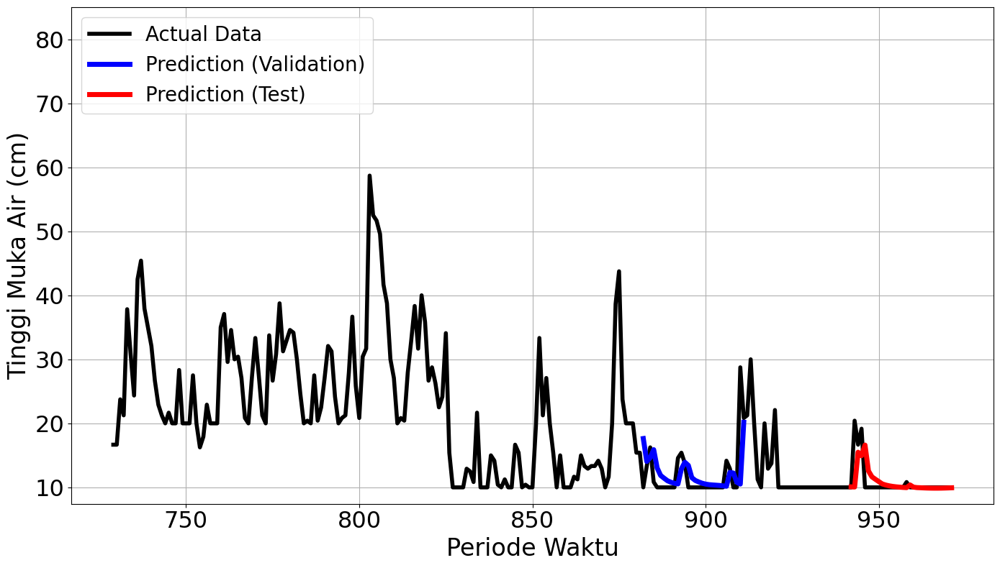

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 505ms/step - loss: 0.1187 - val_loss: 0.0562
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0266 - val_loss: 0.1441
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1701 - val_loss: 0.0469
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0145 - val_loss: 0.0658
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0249 - val_loss: 0.0361
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0093 - val_loss: 0.0237
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0104 - val_loss: 0.0226
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0123 - val_loss: 0.0221
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0066 - val_loss: 0.0225
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0103 - val_loss: 0.0221
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0076 - val_loss: 0.0212
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0091 - val_loss: 0.0206


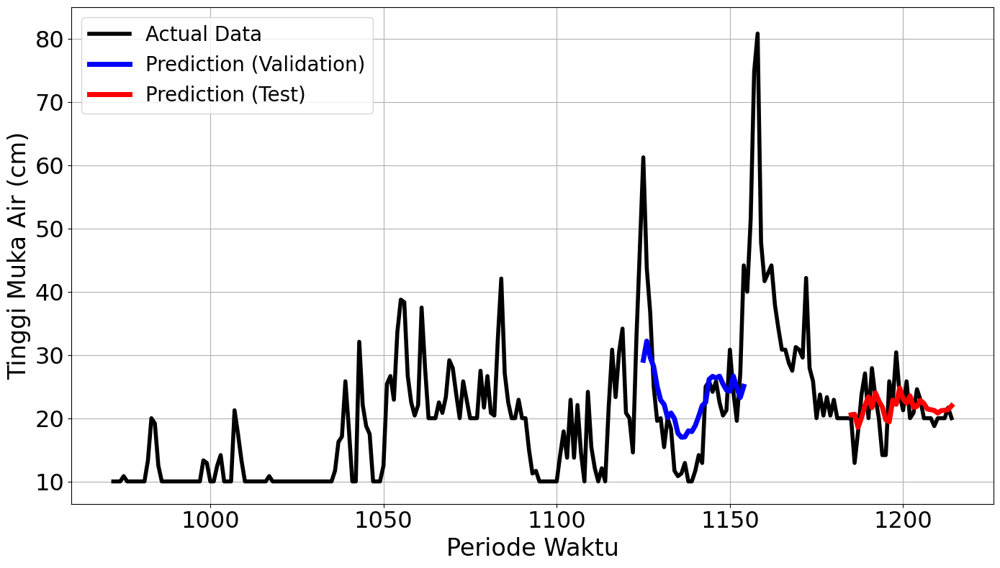

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2810
Final Average MAPE Test: 0.2309
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1945 - val_loss: 0.1936
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0351 - val_loss: 0.1596
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0214 - val_loss: 0.1038
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0138 - val_loss: 0.0705
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0112 - val_loss: 0.0634
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0087 - val_loss: 0.0650
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0078 - val_loss: 0.0654
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0087 - val_loss: 0.0603
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0073 - val_loss: 0.0509
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0069 - val_loss: 0.0414
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0078 - val_loss: 0.0341
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0056 - val_loss: 0.

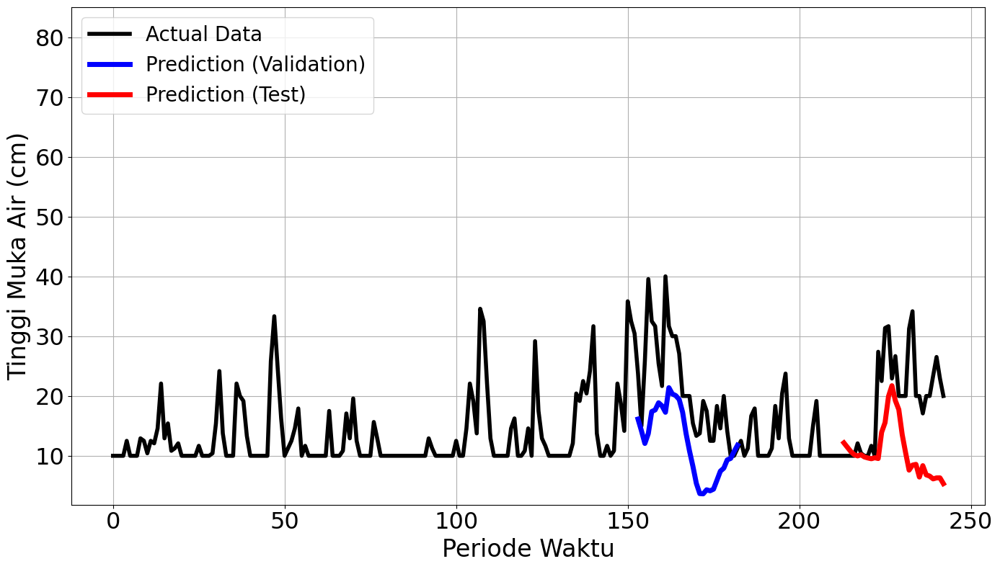

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0421 - val_loss: 0.2494
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 796ms/step - loss: 0.1555 - val_loss: 0.0668
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0808 - val_loss: 0.0335
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0290 - val_loss: 0.0395
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0236 - val_loss: 0.0416
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0229 - val_loss: 0.0424
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0162 - val_loss: 0.0434
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0206Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0206 - val_loss: 0.0436
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
mape validation = 49.87109453944931 %
mape test = 28.591405327708426 %


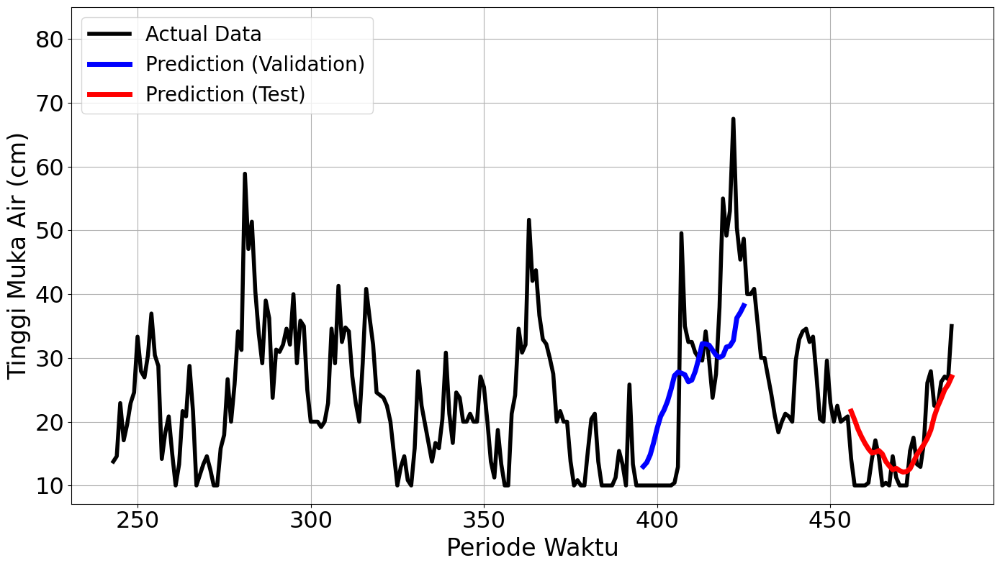

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1632 - val_loss: 0.0537
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - loss: 0.0561 - val_loss: 0.0047
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0130 - val_loss: 0.0213
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0186 - val_loss: 0.0018
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0051 - val_loss: 0.0051
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0068 - val_loss: 0.0109
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0092 - val_loss: 0.0038
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0077 - val_loss: 9.4620e-04
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0061 - val_loss: 0.0099
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0072 - val_loss: 0.0106
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0088 - val_loss: 0.0020
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0033 - val_lo

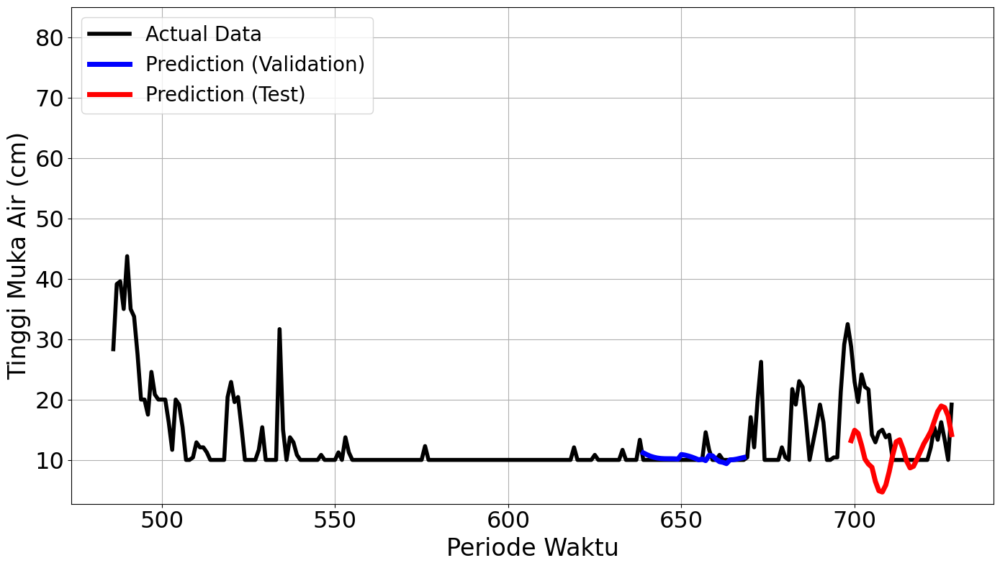

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1128 - val_loss: 0.1658
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step - loss: 0.1406 - val_loss: 0.1133
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0863 - val_loss: 0.0055
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0297 - val_loss: 0.0078
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.0262 - val_loss: 0.0104
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0223 - val_loss: 0.0106
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0181 - val_loss: 0.0103
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0183Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0183 - val_loss: 0.0088
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
mape validation = 38.695493930296806 %
mape test = 105.89631629601574 %


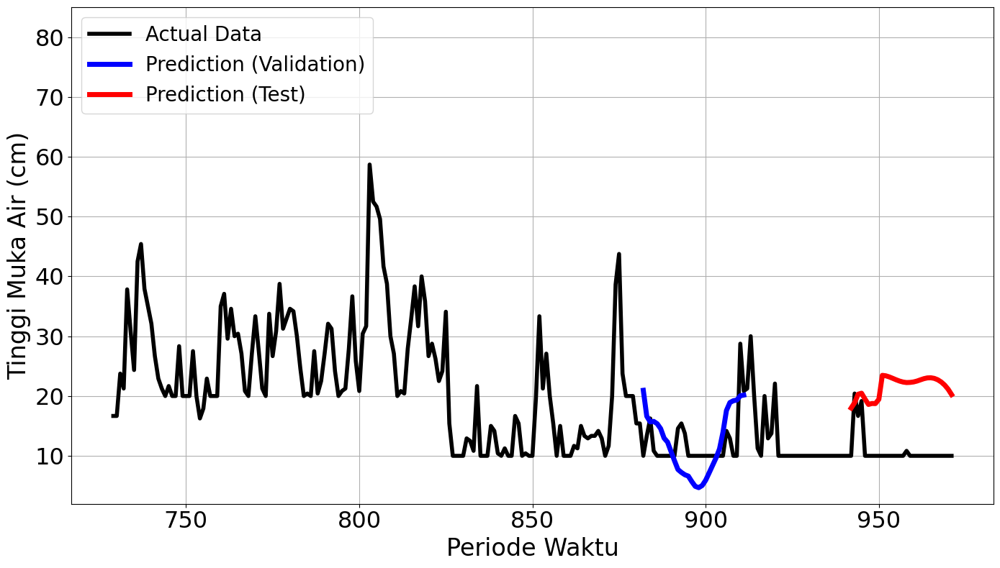

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1288 - val_loss: 0.0575
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.0388 - val_loss: 0.0408
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0230 - val_loss: 0.0284
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0106 - val_loss: 0.0278
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0154 - val_loss: 0.0334
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0157 - val_loss: 0.0301
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0113 - val_loss: 0.0342
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0099 - val_loss: 0.0448
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0093Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0093 - val_loss: 0.0564
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
mape validation = 31.236153486304357 

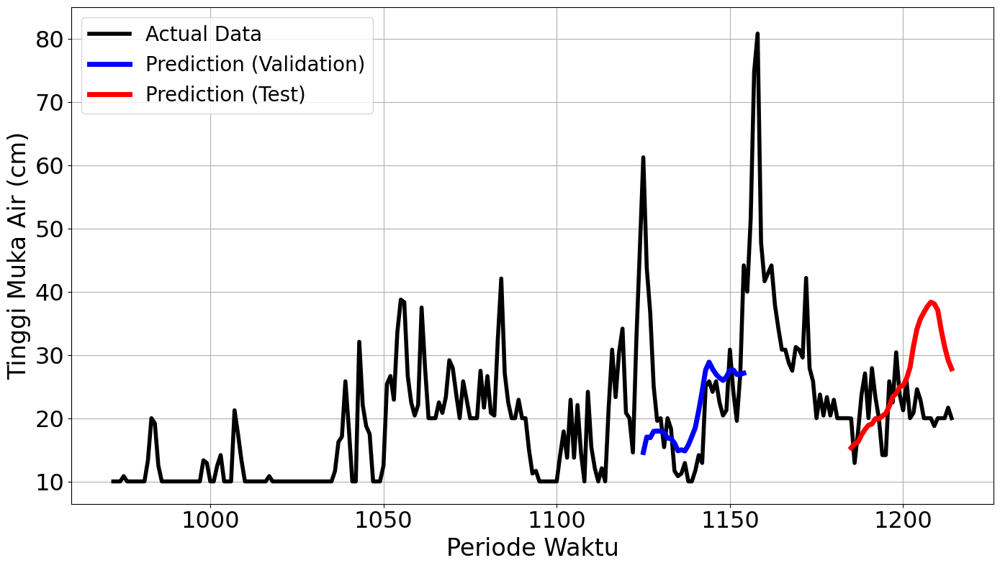

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3337
Final Average MAPE Test: 0.4914
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1945 - val_loss: 0.1936
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0351 - val_loss: 0.1596
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0214 - val_loss: 0.1038
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0138 - val_loss: 0.0705
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0112 - val_loss: 0.0634
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0087 - val_loss: 0.0650
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0078 - val_loss: 0.0654
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0087 - val_loss: 0.0603
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0073 - val_loss: 0.0509
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0069 - val_loss: 0.0414
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0078 - val_loss: 0.0341
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - loss: 0.0056 - val_loss: 0.

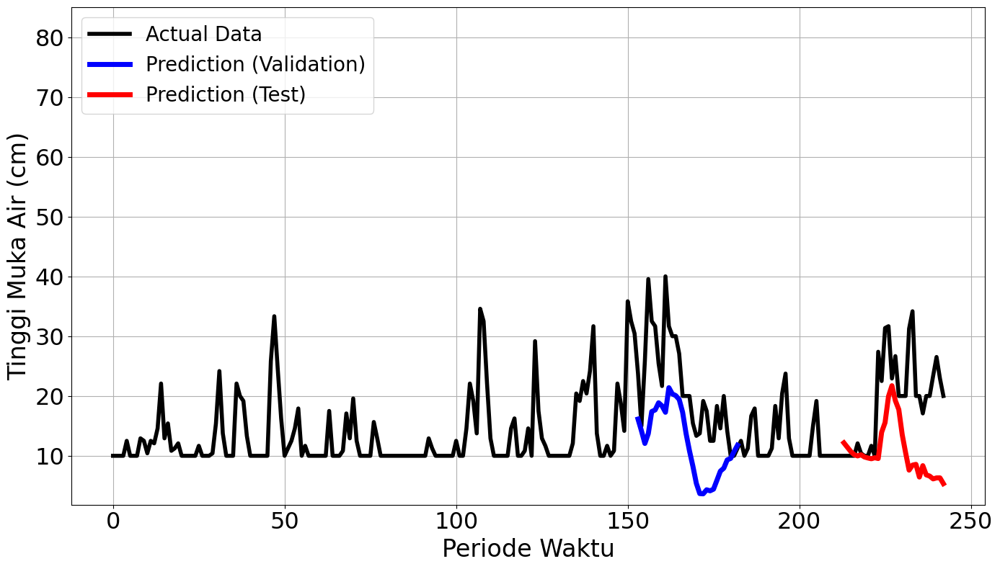

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0421 - val_loss: 0.2494
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.1555 - val_loss: 0.0668
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0808 - val_loss: 0.0335
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0290 - val_loss: 0.0395
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0236 - val_loss: 0.0416
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0229 - val_loss: 0.0424
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0162 - val_loss: 0.0434
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0206Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0206 - val_loss: 0.0436
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
mape validation = 49.87109453944931 %
mape test = 28.591405327708426 %


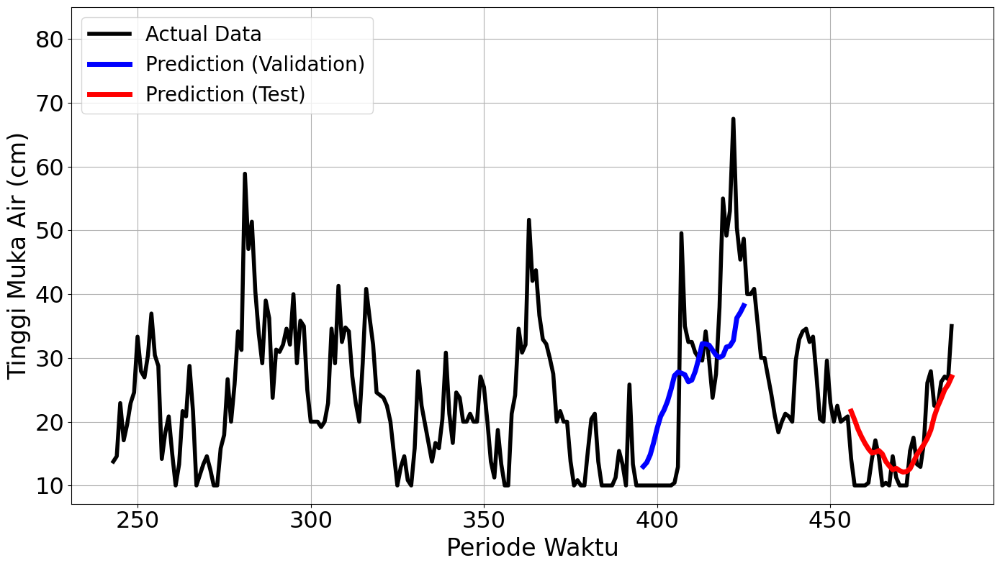

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1632 - val_loss: 0.0537
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0561 - val_loss: 0.0047
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0130 - val_loss: 0.0213
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0186 - val_loss: 0.0018
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0051 - val_loss: 0.0051
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0068 - val_loss: 0.0109
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0092 - val_loss: 0.0038
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0077 - val_loss: 9.4620e-04
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0061 - val_loss: 0.0099
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0072 - val_loss: 0.0106
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0088 - val_loss: 0.0020
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0033 - val_loss:

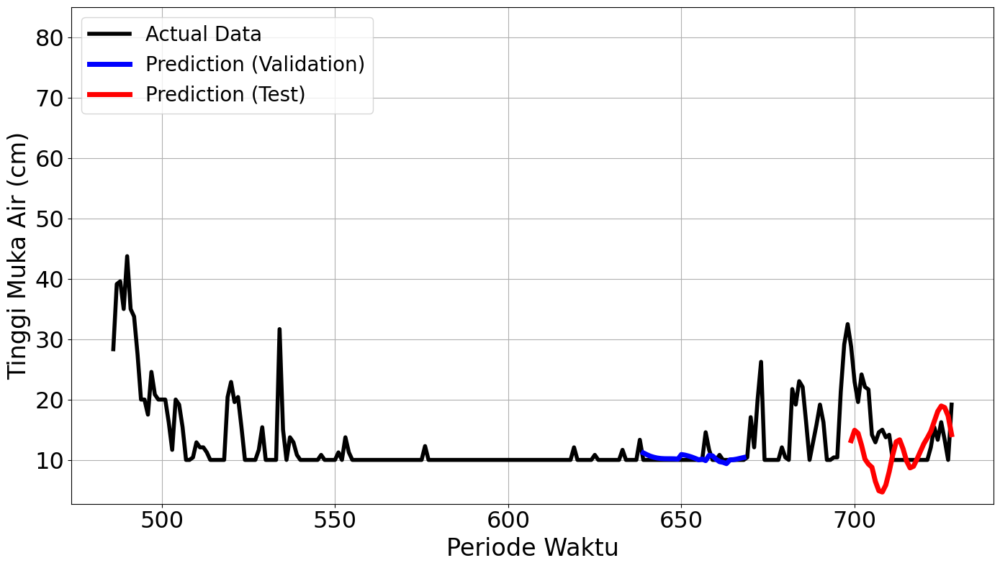

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1128 - val_loss: 0.1658
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.1406 - val_loss: 0.1133
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0863 - val_loss: 0.0055
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0297 - val_loss: 0.0078
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0262 - val_loss: 0.0104
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0223 - val_loss: 0.0106
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0181 - val_loss: 0.0103
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0183Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0183 - val_loss: 0.0088
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
mape validation = 38.695493930296806 %
mape test = 105.89631629601574 %


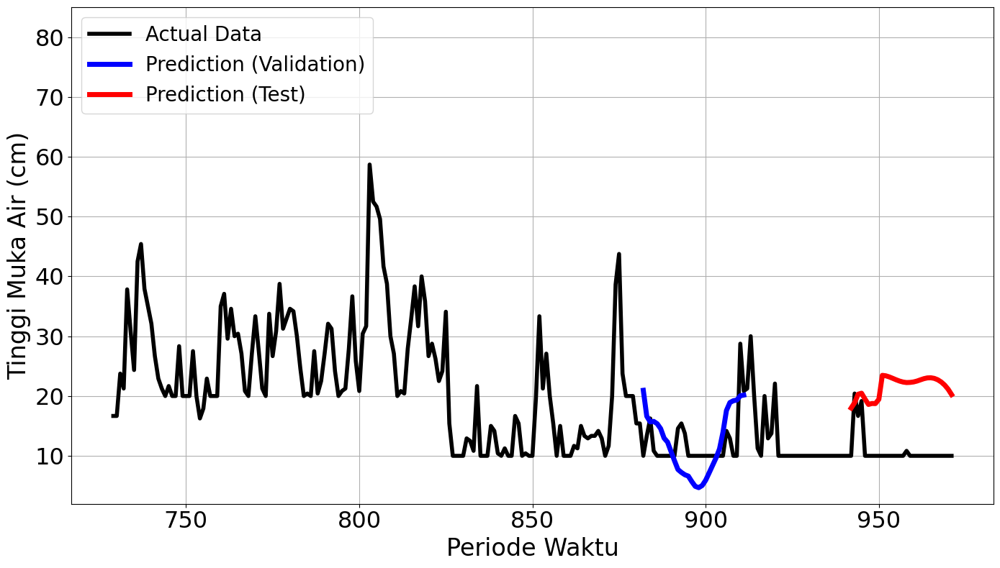

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1288 - val_loss: 0.0575
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - loss: 0.0388 - val_loss: 0.0408
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0230 - val_loss: 0.0284
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0106 - val_loss: 0.0278
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0154 - val_loss: 0.0334
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0157 - val_loss: 0.0301
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0113 - val_loss: 0.0342
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0099 - val_loss: 0.0448
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0093Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0093 - val_loss: 0.0564
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
mape validation = 31.236153486304357 %


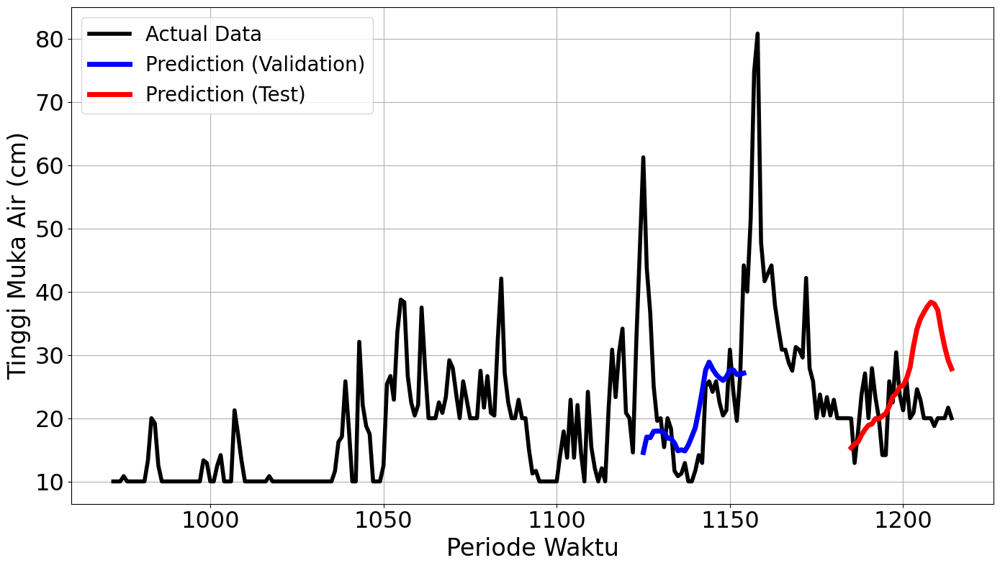

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3337
Final Average MAPE Test: 0.4914


In [10]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Parameter Sliding Window Cross Validation
window_size = 243
n_test = 60
n_train_and_val = window_size - n_test
n_train = n_train_and_val - 60
shift = 243
n_windows1 = 5
n_total = len(data_series)
look_back = 30
time_step = 30

import itertools

config_params = {
    "learning_rate" : [0.001, 0.005],
    "batch_size" : [16, 32, 64, 128],
    "neurons" : [50],
    "init_scheme": ['he_uniform', 'glorot_uniform']
}

average_mape_vals_by_param = []
average_mape_tests_by_param = []

for xs in itertools.product(*list(config_params.values())):
  current_param = dict()
  for i, key in enumerate(config_params.keys()):
    if key == "batch_size":
      bsize = xs[i]
    else:
      current_param[key] = xs[i]

  mape_vals = []
  mape_tests = []

  for i in range(n_windows1):
      start = i * shift
      end = start + window_size
      if end > n_total:
          print(f"Window {i+1} tidak dapat dibuat karena melebihi batas data.")
          break

      window_data = data_series[start:end] #sliding window
      train_and_val = window_data[:n_train_and_val]
      train = train_and_val[:n_train]
      val = train_and_val[n_train:]
      test = window_data[n_train_and_val:]

      try:

          train_generator = TimeseriesGenerator(train, train, length=look_back, batch_size=bsize)

          val_generator = TimeseriesGenerator(val, val, length=look_back, batch_size=bsize)

          test_generator = TimeseriesGenerator(test, test, length=look_back, batch_size=bsize)

          model = create_model(current_param['neurons'], current_param['learning_rate'])

          # model.compile(optimizer='adam', loss='mean_squared_error')

          model.fit(train_generator, epochs=150, validation_data=val_generator, callbacks=[EarlyStoppingAtMinLoss(patience=5)], verbose = 1)

          val_predictions = model.predict(val_generator)
          test_predictions  = model.predict(test_generator)

          val_predictions_descale = scaler.inverse_transform(val_predictions).flatten()
          test_predictions_descale = scaler.inverse_transform(test_predictions).flatten()

          train_actual = scaler.inverse_transform(train).flatten()
          val_actual = scaler.inverse_transform(val).flatten()
          test_actual = scaler.inverse_transform(test).flatten()

          all_actual = np.append(np.append(train_actual, val_actual), test_actual)

          val_true = val[look_back:]
          val_true_descale = scaler.inverse_transform(val_true).flatten()
          mape_val = mean_absolute_percentage_error(val_true_descale, val_predictions_descale)

          test_true = test[look_back:]
          test_true_descale = scaler.inverse_transform(test_true).flatten()
          mape_test = mean_absolute_percentage_error(test_true_descale, test_predictions_descale)

          mape_vals.append(mape_val)
          mape_tests.append(mape_test)

          print(f"mape validation = {mape_val * 100} %")
          print(f"mape test = {mape_test * 100} %")

          # X_actual = np.arange(0, len(train) + len(val) + len(test))
          # X_train = np.arange(0, len(train))
          # X_val = np.arange(len(train) + look_back, len(train) + len(val))
          # X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          start_idx = start
          X_actual = np.arange(start_idx, start_idx + len(train) + len(val) + len(test))
          X_val = np.arange(start_idx + len(train) + look_back, start_idx + len(train) + len(val))
          X_test = np.arange(start_idx + len(train) + len(val) + look_back, start_idx + len(train) + len(val) + len(test))
          # axs[i].plot(X_actual, all_actual, lw=2, color='black', label='actual data')
          # axs[i].plot(X_val, val_predictions_descale, lw=2.5, color='blue', label='prediction validation')
          # axs[i].plot(X_test, test_predictions_descale, lw=2.5, color='red', label='prediction test')
          # axs[i].set_title(f'Window {i+1}')
          # axs[i].legend(loc='upper left')  # legend untuk setiap subplot
          plt.figure(figsize=(14, 8))
          plt.plot(X_actual, all_actual, lw=4, color='black', label='Actual Data')
          plt.plot(X_val, val_predictions_descale, lw=5, color='blue', label='Prediction (Validation)')
          plt.plot(X_test, test_predictions_descale, lw=5, color='red', label='Prediction (Test)')
          # plt.title(f'Window {i+1}', fontsize=25)
          plt.xlabel('Periode Waktu', fontsize=24)
          plt.ylabel('Tinggi Muka Air (cm)', fontsize=24)
          plt.ylim(top=85)
          plt.tick_params(axis='both', labelsize=23)
          # plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
          plt.legend(loc='upper left', fontsize=20)
          plt.grid(True)
          plt.tight_layout()
          plt.show()

      except Exception as e:
          print(f"Error pada Window {i+1}: {e}")
          continue

  # Setelah loop selesai semua
  plt.tight_layout(rect=[0, 0, 1, 0.97])
  plt.show()

  # Rata-rata MAPE akhir
  if mape_vals and mape_tests:
      final_mape_val = np.mean(mape_vals)
      final_mape_test = np.mean(mape_tests)
      print(f"\nFinal Average MAPE Validation: {final_mape_val:.4f}")
      print(f"Final Average MAPE Test: {final_mape_test:.4f}")
      average_mape_vals_by_param.append(final_mape_val)
      average_mape_tests_by_param.append(final_mape_test)

### Hyperparameter Summary (SWCV)

In [11]:
hyperparameter_summary = pd.DataFrame({
    "mape_vals" : average_mape_vals_by_param,
    "mape_tests" : average_mape_tests_by_param
})


hyperparameter_summary.sort_values("mape_tests")

,mape_vals,mape_tests
12,0.281012,0.230877
13,0.281012,0.230877
10,0.312367,0.324328
11,0.312367,0.324328
9,0.244042,0.423443
8,0.244042,0.423443
15,0.333692,0.491424
14,0.333692,0.491424
1,0.535652,0.642646
0,0.535652,0.642646


In [12]:
best_idx = int(hyperparameter_summary.sort_values("mape_tests").index[0])
best_idx

12

In [13]:
parameter_combinations = list(itertools.product(*list(config_params.values())))
best_parameter = parameter_combinations[best_idx]
best_param = dict()
for i, key in enumerate(config_params.keys()):
  best_param[key] = best_parameter[i]
best_param

{'learning_rate': 0.005,
 'batch_size': 64,
 'neurons': 50,
 'init_scheme': 'he_uniform'}

### Best Parameter (SWCV)

In [14]:
best_param = {'learning_rate': 0.005, 'batch_size': 64, 'neurons': 50, 'init_scheme': 'he_uniform'}

In [15]:
from tensorflow.keras.initializers import HeUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Tentukan skema inisialisasi bobot
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    else:
        raise ValueError("init_scheme yang didukung hanya: 'he_uniform'.")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(time_step, 1),
        kernel_initializer=initializer,
        recurrent_initializer=initializer
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1, kernel_initializer=initializer))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [16]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Data/Data%20TMA%20(Jan%202022%20-%20Mei%202025).csv')
data = data.loc[:, ['Daily_Period', 'TMA_Daily']]
data = data.iloc[972:1215].reset_index(drop=True)

train_data = data.iloc[:123]
val_data = data.iloc[123:183]
test_data = data.iloc[183:]

# Mengambil kolom 'TMA_Daily' sebagai data yang akan diprediksi
time_series_data = data['TMA_Daily'].values.reshape(-1, 1)

# Normalisasi data ke rentang 0-1
scaler = MinMaxScaler()
time_series_data = scaler.fit_transform(time_series_data)

# Menentukan ukuran dataset
train_size = 123
val_size = 60
test_size = len(time_series_data) - train_size - val_size

# Membagi data menjadi train, val, test
train_data = time_series_data[:train_size]
val_data = time_series_data[train_size:train_size+val_size]
test_data = time_series_data[train_size+val_size:]

# Fungsi untuk membuat dataset dengan sekuens deret waktu
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i : i + seq_length])
    return np.array(sequences)

# Panjang sekuens deret waktu
seq_length = 30

# Membuat dataset sekuens
X_train = create_sequences(train_data, seq_length)
X_val = create_sequences(val_data, seq_length)
X_test = create_sequences(test_data, seq_length)

# Memisahkan fitur dan target
y_train = X_train[:, -1]
X_train = X_train[:, :-1]

y_val = X_val[:, -1]
X_val = X_val[:, :-1]

y_test = X_test[:, -1]
X_test = X_test[:, :-1]

# Reshape untuk input LSTM (samples, time steps, features)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

model = create_model(best_param['neurons'],
                     best_param['learning_rate'],
                     best_param.get('init_scheme', 'glorot_uniform')
)
history = model.fit(
    X_train, y_train,
    epochs=150,
    batch_size=64,
    validation_data=(X_val, y_val),
    verbose=10)

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/150
Epoch 74/150
Epoch 75/150
Epoch 76/150
Epoch 77/150
Epoch 78/150
Epoch 7

### Plot Model Loss

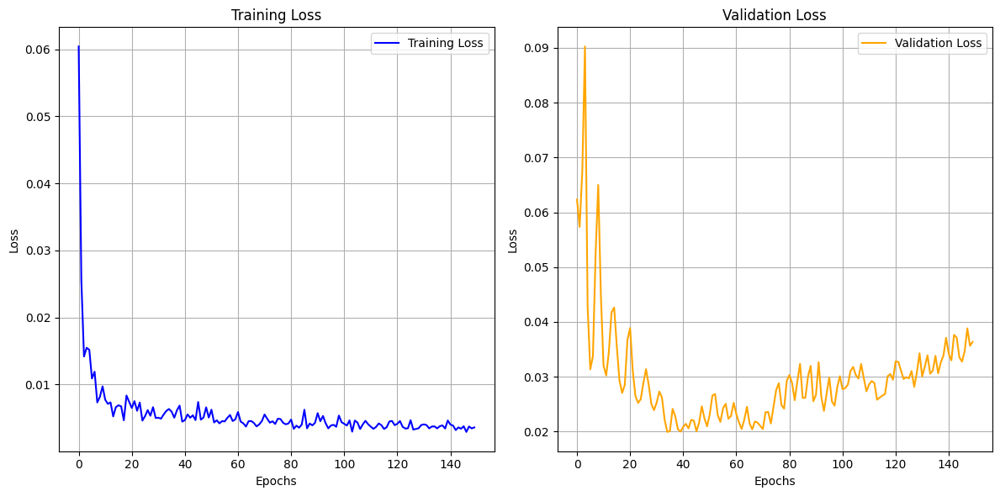

In [17]:
import matplotlib.pyplot as plt

# Membuat subplot 1 baris 2 kolom
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Subplot kiri: Training Loss
axs[0].plot(history.history['loss'], label='Training Loss', color='blue')
axs[0].set_title('Training Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].grid(True)
axs[0].legend()

# Subplot kanan: Validation Loss
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='orange')
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].grid(True)
axs[1].legend()

# Tata letak rapat
plt.tight_layout()
plt.show()

### MAPE Train

In [18]:
def inverse_transform(scaler, input):
  return input * (scaler.data_max_[0] - scaler.data_min_[0]) + scaler.data_min_[0]

# inverse_transform(scaler, predicted)

In [19]:
train_predict = model.predict(X_train).flatten()
train_predict_denorm = inverse_transform(scaler, train_predict)
y_train_denorm = inverse_transform(scaler, y_train)
mape_train = mean_absolute_percentage_error(y_train_denorm, train_predict_denorm)
mape_train

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


0.16603569957776496

### Plot Train Actual vs Predicted

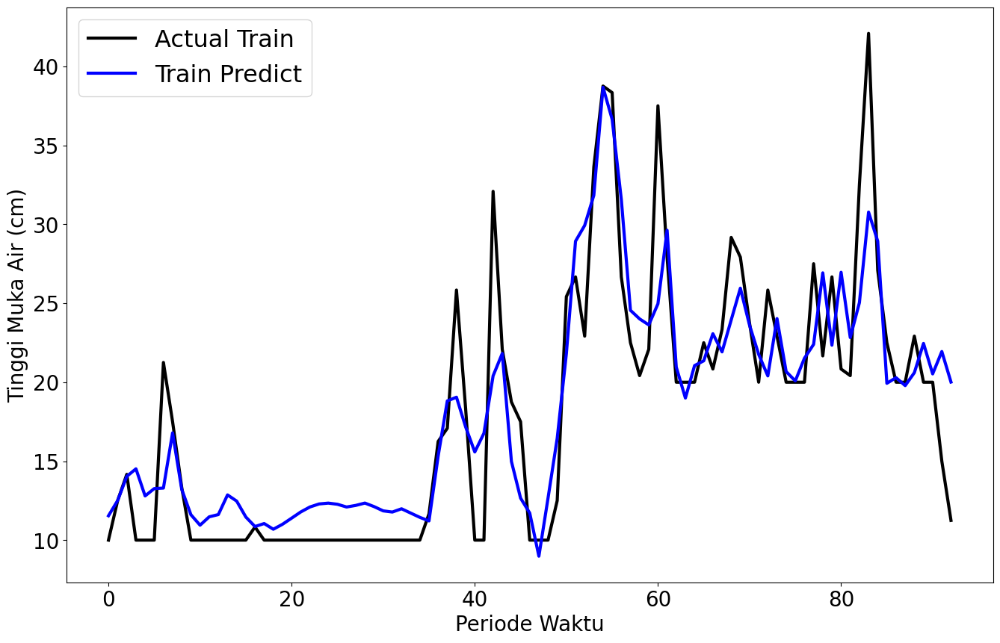

In [20]:
# Plot perbandingan actual train dan train predict

plt.figure(figsize=(16, 10))

plt.plot(y_train_denorm, lw=3, label='Actual Train', color = 'black')
plt.plot(train_predict_denorm, lw=3, label='Train Predict', color = 'blue')
# plt.title('Perbandingan Actual Train dan Train Predict')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Periode Waktu', fontsize=20)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=20)
plt.legend(loc = 'upper left', fontsize = 23)
plt.show()